# **Do Trees Influence The Health of NY Citizens?** #

Full analysis corresponding to the website: https://share.streamlit.io/ninaoeh/newyork_health_analysis_social_data_analysis/main/website_health_in_NY.py

## **1. Motivation** ##

Imagine yourself, sitting on a bench and listening to the wind, that softly strokes and shuffles the soft, green leaves of the tree, standing next to the bench. You look up and are blinded by a few beams of afternoon sun cheekily peeking through the umbrella of leaves, forcing you to close your eyes and give in to the moment. There is the song of a blackbird, singing to the scene from one of the branches of the tree and the distinct reply of another blackbird further away. You also hear the buzzing of insects that feed on the trees’ blossoms. Then, suddenly, the loud roar of a combustive engine –  you open your eyes and are back in the city, sitting on one of the few benches next to the main road.

We all know the calming effect that nature can have on us and it is proven, that street trees are no exception for that. Scientist that studied the effect of street trees on mental health in France in 2020 found out, that the presence of street trees can even be more efficient than antidepressive ([Marselle et.al, Urban street tree biodiversity and antidepressant prescriptions](https://www.nature.com/articles/s41598-020-79924-5#citeas)). But what about the physical health? Obviously, due to their carbon-storing nature through photosynthesis, trees should have a positive effect on the air-quality in a city. But is this influence trackable and further more big enough to have an actual impact on the health of the cities inhabitants? Or are social factors more important than city trees?
                
In this project, we explore the impact of tree distribution on the health and air quality outcomes of the residents of New York. We also include socioeconomic factors (such as poverty and unemployment rates) to understand the impact of such factors relative to the tree distribution in the city.

We focus our analysis on each of the 59 community districts of NYC.

### **Datasets and Descriptions** ###

We use three major datasets:
1. **Air quality data:** This is the data that contain the pollution concentrations for different pollutants in NY between 2005 and 2018. We focus on the sulfer dioxide and fine particualr matter concentration for our model. 
1. **Health data:** This is the main dataset, which includes the health outcomes of NY residents, such as life expectancy and rate of asthma.
1. **Tree data:** This is the distribution of trees in NYC, including the health and location of each tree in the city.


Below are the detailed descriptions of each dataset.


#### **Air Quality Dataset Description** ####


This dataset contains information about New York City air quality surveillance data.

Air pollution is one of the most important environmental threats to urban populations and while all people are exposed, pollutant emissions, levels of exposure, and population vulnerability vary across neighborhoods. Exposures to common air pollutants have been linked to respiratory and cardiovascular diseases, cancers, and premature deaths. These indicators provide a perspective across time and NYC geographies to better characterize air quality and health in NYC. Data can also be explored online at the Environment and Health Data Portal: ([Source](http://nyc.gov/health/environmentdata)).

Shape:  (14289, 12)

Variables in the dataset:
- **unique_id** (text): Unique record identifier
- **indicator_id** (number): Identifier of the type of measured value across time and space
- **name** (text): Name of the indicator
- **measure** (text): How the indicator is measured
- **measure_info** (text): Information (such as units) about the measure
- **geo_type_name** (text): Geography type; UHF' stands for United Hospital Fund neighborhoods; For instance, Citywide, Borough, and Community Districts are different geography types
- **geo_join_id** (text): Identifier of the neighborhood geographic area, used for joining to mapping geography files to make thematic maps
- **geo_place_name** (text): Neighborhood name
- **time_period** (text): Description of the time that the data applies to ; Could be a year, range of years, or season for example
- **start_date** (floating_timestamp): Date value for the start of the time_period; Always a date value; could be useful for plotting a time series
- **data_value** (number): The actual data value for this indicator, measure, place, and time

#### **Health Dataset Description** ####


The dataset containts information on the health status as well as social status of the citizens of New York City, grouped into the districts of the city. The dataset joints data from various American Services. Within this analysis, the used data results from the [New York City Community Health Survey (CHS)](https://www1.nyc.gov/site/doh/data/data-sets/community-health-survey.page) and the [American Community Survey (ACS)](https://www.census.gov/programs-surveys/acs). These surveys are conducted annually by the DOHMH, Division of Epidemiology, Bureau of Epidemiology Services and U.S. Census Bureau. The CHS is a telephone survey, that anually collects random samples of 10000 adults spread across the city of New York. It provides a robust estimation on the health of New Yorkers, including neighborhood, borough, and citywide estimates on a broad range of chronic diseases and behavioral risk factors. The ACS is a nation wide Survey, that focusses on social aspects and wealth, that anually collects data from about 3.5 million addresses across the United States of America. The dataset was obtained from the public records of NYC gov ([Source](https://www1.nyc.gov/site/doh/data/data-publications/profiles-2015-community-health-profiles.page)). 

Shape of initial dataset:  (68, 194)\
Shape of subset of dataset used for analysis: (59, 8)

Variables in the dataset:
- **ID** (number): Identifier of the neighborhood geographic area, used for joining to mapping geography files to make thematic maps
- **Name** (text): Name of the neighborhood geographic area
- **Avoidable_Asthma** (number): Age-adjusted avoidable hospitalizations for asthma per 100,000 adults (AHRQ PQIs 5 and 15) (Individuals may report a homeless shelter, a post office box, the Post Office’s General Delivery Window or a residential treatment facility as their residential address. This may lead to higher hospitalization rates in some neighborhoods, depending on what institutions or residential facilities are located in the Community District)
- **Poverty** (number): Percent of individuals living below the federal poverty threshold
- **Unemployment** (number): Percent of the civilian population 16 years and older that is unemployed
- **Self_rep_health** (number): Age-adjusted percent of adults reporting that their health is “excellent,” "very good," or “good” on a 5-level scale (Poor, Fair, Good, Very Good or Excellent)
- **Smoking** (number): Identifier of the neighborhood geographic area, used for joining to mapping geography files to make thematic maps
- **Life_expectancy_rate** (number): Life expectancy at birth in years 


#### **Tree Dataset Description** ####

The tree dataset describes each tree as observed by either volunteers or staff, including trees' diameters, heights, and  status (health, dead, alive etc). The data include the exact location for each tree, with lang and long, which are also converted to the cartesian plane (X and Y). The dataset is collected for three years: 1995, 2005, and 2015. We focus most of our analysis on the 2015 data, since this corresponds with the datasets of air quality and health as well. The dataset came originally from the NYC Parks and Recreation staff as part of their TreeCount! program ([Source](https://www.kaggle.com/datasets/nycparks/tree-census)).

Shape of the initial dataset: (683788, 41)\
Shape for modeling and final analysis: (59,10)

Features in the final dataset:

- **cb_num** (category): Identifier of the neighborhood geographic area, used for joining to mapping geography files to make thematic maps of each district
- **count_2015** (number): Count of trees for each district as of 2015
- **count_2005** (number): Count of trees for each district as of 2005
- **count_1995** (number): Count of trees for each district as of 1995
- **area_km2** (number): Area of each district in New York City
- **counts_per_km2_2015** (number): Density of trees in each district for the 2015 dataset(count of trees/area)
- **counts_per_km2_2005** (number): Density of trees in each district for the 2005 dataset(count of trees/area)
- **counts_per_km2_1995** (number): Density of trees in each district for the 1995 dataset(count of trees/area)
- **parkarea [km^2]** (number): Area of all parks in each district
- **park_percent** (number): Percent of parks of the total district area





#### **Datasets Choice:** ####

There are many datasets available for NYC. We chose these datasets because they are comprehensive and highly detailed, and they were collected from official sources. The inclusion of additional socioeconomic factors adds complexity to the project, but it is essential to truly understand the impact of trees relative to other factors. Without them, our results will be biased towards having more trees for much better health outcomes, even if their impact is not significant.


#### **End User Experience Goal:** ####

The target audience for this project's website is a lay person who is interested in data and trends, but not necessarily trained in  data science. We plan to minimize technical jargon and mathematical formulas on the website. We want the user to have a better understanding of the relationship between features (tree data and socioeconomic factors) and the health outcomes of NYC residents.

We plan to design a website that is easy to navigate and understand.

## 2. Basic Stats

### **Preprocessing and Cleaning** ###

We describe our cleaning and data wrangling process below (with also the code blocks).

In [1]:
import numpy as np
import pandas as pd
import geopandas as gpd
import datetime as dt
from random import randint
import os
import json
import xgboost as xgb
import urllib.request
import tempfile
import matplotlib.pyplot as plt
import matplotlib
import seaborn as sns
import scipy
from scipy.stats import norm
import requests
import plotly.graph_objects as go
import plotly.express as px
import plotly as py
import folium
import bokeh
from zipfile import ZipFile
from sklearn.tree import DecisionTreeClassifier
from sklearn.preprocessing import OneHotEncoder, LabelEncoder
from sklearn.model_selection import cross_val_score, GridSearchCV, KFold, RandomizedSearchCV, train_test_split
from sklearn.metrics import plot_confusion_matrix, confusion_matrix,mean_absolute_error, classification_report, ConfusionMatrixDisplay, auc, accuracy_score, confusion_matrix, mean_squared_error,accuracy_score, f1_score, precision_score, recall_score, classification_report, confusion_matrix
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor, RandomForestClassifier
from sklearn import tree
from plotly.subplots import make_subplots
from plotly.io import write_image
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib.pyplot import figure
from math import radians, cos, sin, asin, sqrt
from functools import reduce
from bokeh.plotting import figure,output_file, show,save
from bokeh.models.widgets import Tabs, Panel
from bokeh.models import Span, FactorRange, ColumnDataSource, Legend, HoverTool, LabelSet, Grid, HBar, LinearAxis, Plot
from bokeh.layouts import layout
from bokeh.io import output_notebook, reset_output, curdoc
from IPython.display import IFrame
from IPython.core.display import display, HTML
import warnings
warnings.filterwarnings('ignore')

#Constants
R = 6371 #Earth radius, km for grid mapping

reset_output() # If you are having issues with visualizing Bokeh plots in the notebook try to uncomment this line
output_notebook() # This is to make sure that bokeh plots in the notebook

%matplotlib inline


Loading BokehJS ...

### **Air Quality Data Preprocessing** ###

Below is the procedure for the air quality dataset wrangling:

- Convert all date data into pandas's datetime format
- Choose certain columns for analysis (see the code below)
- Focus on **Sulfer Dioxide (SO2)** and **Fine Particulate Matter (PM2.5)**, for research shows that these two variables can be indicators of asthma. ([Source](https://pubmed.ncbi.nlm.nih.gov/16585079/#:~:text=In%20conclusion%2C%20repeated%20peak%20exposure,hypothesis%20of%20irritant%2Dinduced%20asthma.))
- Convert the district numbers into human-readable district names.

In [2]:
# Loading Air quality dataset
df_air = pd.read_csv("./data/air_quality/Air_Quality.csv")
df_air['Start_Date'] = pd.to_datetime(df_air['Start_Date'])
df_air['Year'] = df_air['Start_Date'].dt.to_period('Y').astype('str')
df_air = df_air[['Name', 'Measure', 'Measure Info', 'Geo Join ID', 'Geo Place Name', 'Data Value', 'Start_Date', 'Year']]
df_air_col_1 = df_air[df_air['Name']=='Fine Particulate Matter (PM2.5)']
df_air_col_2 = df_air[df_air['Name']=='Sulfur Dioxide (SO2)']
df_air_col_1 = df_air_col_1.groupby('Geo Join ID').mean()
df_air_col_1.columns = ['Fine Particulate Matter (PM2.5)'] 
df_air_col_2 = df_air_col_2.groupby('Geo Join ID').mean()
df_air_col_2.columns = ['Sulfur Dioxide (SO2)']

# Helper dictionary
id_neighbourhood_dict = {}
for id_num in set(df_air['Geo Join ID']):
    id_neighbourhood_dict[id_num] = df_air[df_air['Geo Join ID'] == id_num]['Geo Place Name'].iloc[0]

# Final Air Quality Dataset ready to be merged with other datasets
df_air_merge = pd.concat([df_air_col_1, df_air_col_2], axis=1, join="inner")

Now **df_air_col_1** and **df_air_col_2** contain the average measurements for every district, in the year 2015 of the pollutants **Fine Particulate Matter (PM2.5)** and **Sulfur Dioxide (SO2)**, respectively. The indexes of the two dataframe are the district IDs.

In [3]:
def get_neighbourhood_name(id_num):
    """
       Convert the district from numerical values to names of neighborhoods
    """
    return df_air[df_air['Geo Join ID'] == id_num]['Geo Place Name'].iloc[0]

In [4]:
id_neighbourhood_dict = {} # Dictionary: {keys: ID, values: district's name}
for id_num in set(df_air['Geo Join ID']):
    id_neighbourhood_dict[id_num] = df_air[df_air['Geo Join ID'] == id_num]['Geo Place Name'].iloc[0]

The data is distributed unequally in the districts. The reason is that in some years the data related to specific pollutants has not been collected in some areas, and some variables are recorded more often than others. The column *Name* contains the variable that is being measured in time and district. Below, the name of the variables and their respective size are represented. 


|Variable | | Size|
|---|---|---|
|**Related to pollutant emissions:**| | |
|Air Toxics Concentrations- Average Benzene Concentrations   |       |              155|
|Air Toxics Concentrations- Average Formaldehyde Concentrations  |    |             155|
|Boiler Emissions- Total NOx Emissions                  |              |             96|
|Boiler Emissions- Total PM2.5 Emissions                |               |            96|
|Boiler Emissions- Total SO2 Emissions              |                   |            96|
|Fine Particulate Matter (PM2.5)           |                         |             4230|
|Nitrogen Dioxide (NO2)                |                             |             4230|
|Ozone (O3)                         |                                |             1551|
|Sulfur Dioxide (SO2)              |                                 |             1128|
||||
|**Related to hospitalizations or deaths:**|||
|O3-Attributable Asthma Emergency Department Visits|     |                          384|
|O3-Attributable Asthma Hospitalizations     |      |                               384|
|O3-Attributable Cardiac and Respiratory Deaths      | |                             192|
||||
|**Related to traffic density:**| ||
|Traffic Density- Annual Vehicle Miles Traveled |        |                          209|
|Traffic Density- Annual Vehicle Miles Traveled for Cars  |    |                     214|
|Traffic Density- Annual Vehicle Miles Traveled for Trucks  |     |               209|

### **Health Data Preprocessing** ###

Below is the procedure for the health dataset wrangling:

- Choose certain columns for analysis (see the code below)
- Rename columns for nicer visualizations
- Prepare the data for merging by specifying the district ID for each feature.

In [5]:
#loading the data
health_data = pd.read_csv('./data/health/2015_Health.csv',sep=";")

In [6]:
# filtering the data according to required subsets
health_data.drop(labels=[0,1,2,3,4,5],axis=0,inplace=True)
health_data=health_data.reset_index()
focus_health=["ID","Name","Avoidable_Asthma","Poverty","Unemployment","Self_rep_health","Smoking","Life_expectancy_rate"]
health_data=health_data.loc[:, health_data.columns.isin(focus_health)]
health_data=health_data.iloc[:59]

#rename columns for nicer visualizations
health_data.rename(columns = {'Life_expectancy_rate':'Life expectancy', 'Self_rep_health':'Self reported health','Avoidable_Asthma':'Avoidable asthma'}, inplace = True)
#rename focus_health according to new column names
focus_health=health_data.columns

In [7]:
#See statistic summary
health_statistics=health_data.describe()
health_statistics

,Poverty,Unemployment,Self reported health,Smoking,Avoidable asthma,Life expectancy
count,59.000000,59.000000,59.000000,59.000000,59.000000,59.000000
mean,21.779661,11.016949,77.728814,15.762712,276.813559,80.559322
std,10.506267,4.002118,7.094997,2.973092,209.387158,2.877506
min,6.000000,5.000000,64.000000,10.000000,46.000000,74.100000
25%,13.000000,7.500000,71.000000,13.500000,119.000000,78.750000
50%,20.000000,10.000000,79.000000,16.000000,218.000000,80.900000
75%,29.000000,14.500000,83.000000,18.000000,359.000000,82.700000
max,44.000000,20.000000,92.000000,22.000000,786.000000,85.400000


#### Define the health dataset for merging with other dataframes

In [8]:
focus_health_merge=["ID","Avoidable asthma","Life expectancy", "Poverty","Smoking","Unemployment","Self reported health"]
df_health_merge=health_data.loc[:, health_data.columns.isin(focus_health_merge)]
df_health_merge=df_health_merge.set_index('ID')
df_health_merge.index = df_health_merge.index.astype('int64')

### **Tree Data Preprocessing** ###

Below is the procedure for the air quality dataset wrangling:

- Remove dead trees 
- Remove trees that do not belong to any community district ("homeless trees")
- Rename 1995 column location to be consistent with the other datasets
- Add the areas, tree density, and park data for each district into a new dataframe for further analysis.

In [9]:
df_trees_1995 = pd.read_csv("./data/trees/new_york_tree_census_1995.csv")
df_trees_2005 = pd.read_csv("./data/trees/clean_new_york_tree_census_2005.csv")
df_trees_2015 = pd.read_csv("./data/trees/new_york_tree_census_2015.csv")
df_trees_types = pd.read_csv("./data/trees/new_york_tree_species.csv")

Will removing the dead trees result in a substantial smaller dataset? In other words, are most trees dead in NYC already?

In [10]:
#Stats on dead trees
print("\n2015\n")
print(df_trees_2015["status"].value_counts(normalize=True))
print("Total trees:", df_trees_2015["status"].count())

print("\n2005\n")
print(df_trees_2005["status"].value_counts(normalize=True))
print("Total trees:", df_trees_2005["status"].count())

print("\n1995\n")
print(df_trees_1995["status"].value_counts(normalize=True))
print("Total trees:", df_trees_1995["status"].count())


2015

Alive    0.953765
Stump    0.025818
Dead     0.020417
Name: status, dtype: float64
Total trees: 683788

2005

Good         0.664218
Excellent    0.239135
Poor         0.082939
Dead         0.013708
Name: status, dtype: float64
Total trees: 592372

1995

Good              0.643267
Excellent         0.193981
Poor              0.074607
Planting Space    0.029461
Dead              0.024873
Unknown           0.020815
Stump             0.011774
Fair              0.000633
Shaft             0.000586
Critical          0.000004
Name: status, dtype: float64
Total trees: 516989


**The dead and stump trees are less than 5% of each dataset. Since our research question relates the impact of the living trees on pollution and health outcomes, we remove the non-living trees for this project.**

In [11]:
#Remove non-alive trees

def remove_dead(df,col, removal, year="", show_stats=True):
    before = len(df)
    df_cln = df[np.isin(df[col],removal, invert=True)]
    after = len(df_cln)
    if show_stats:
        print(f"{year} Count before removal:", before)
        print(f"{year} Count after removal:", after)
        print()
    return df_cln

#Removal array:
remov = [
    "Dead",
    "Planting Space",
    "Unknown",
    "Stump"
]
df_trees_2015_cln = remove_dead(df_trees_2015, "status", remov, "2015")
df_trees_2005_cln = remove_dead(df_trees_2005, "status", remov, "2005")
df_trees_1995_cln = remove_dead(df_trees_1995, "status", remov, "1995")

2015 Count before removal: 683788
2015 Count after removal: 652173

2005 Count before removal: 592372
2005 Count after removal: 584252

1995 Count before removal: 516989
1995 Count after removal: 472051



In [12]:
#Remove homeless trees (no district is specified)
df_trees_2015_cln = df_trees_2015_cln[df_trees_2015_cln["cb_num"] != 0]
df_trees_2005_cln = df_trees_2005_cln[df_trees_2005_cln["cb_num"] != 0]
df_trees_1995_cln = df_trees_1995_cln[df_trees_1995_cln["cb_new"] != 0]

In [13]:
#Rename the cb data column for 1995:
df_trees_1995_cln.rename(columns={"cb_new":"cb_num"}, inplace=True)

In [14]:
###Tree Density calculations###
file = open("./data/geo_files/json/community_districts_updated.geojson")
geo = json.load(file)

In [15]:
#Extract the districts' areas
dataset = geo["features"]
res = {}

for i, district in enumerate(dataset):
    ar = district["properties"]["Shape_Area"]
    geoid = district["properties"]["BoroCD"]
    res[geoid] = ar / 1000000

    #Fix the "id" entry for plotly
    geo["features"][i]["id"] = geoid

    
df_areas = pd.DataFrame(res.items(), columns=["cb_num", "area_km2"])

In [16]:
#Add the tree counts by district for each year to the areas dataframe

count_trees = lambda df,year: df.groupby(by=["cb_num"]).size().reset_index(name=f"count_{year}")
    
counts_2015 = count_trees(df_trees_2015_cln, 2015)
counts_2005 = count_trees(df_trees_2005_cln, 2005)
counts_1995 = count_trees(df_trees_1995_cln, 1995)

In [17]:
#Merge the counts

dfs = [counts_2015, counts_2005, counts_1995, df_areas]
df_counts = reduce(lambda left, right:pd.merge(left, right, on="cb_num", how="outer"), dfs)
years = [2015, 2005, 1995]

for y in years:
    df_counts[f"counts_per_km2_{y}"] = df_counts[f"count_{y}"] / df_counts["area_km2"]
df_counts["cb_num"] = df_counts["cb_num"].astype("int64")
df_counts

,cb_num,count_2015,count_2005,count_1995,area_km2,counts_per_km2_2015,counts_per_km2_2005,counts_per_km2_1995
0,101,2297.0,1562.0,1040.0,42.527843,54.011675,36.728879,24.454568
1,102,4833.0,4061.0,3751.0,37.721691,128.122571,107.656893,99.438809
2,103,4709.0,2938.0,2568.0,46.906822,100.390515,62.634812,54.746834
3,104,4419.0,3540.0,2987.0,49.291490,89.650363,71.817670,60.598695
4,105,2031.0,1764.0,2012.0,43.796763,46.373290,40.276949,45.939468
...,...,...,...,...,...,...,...,...
66,595,NaN,149.0,16.0,54.704888,NaN,2.723705,0.292478
67,484,NaN,NaN,27.0,128.852218,NaN,NaN,0.209542
68,356,NaN,NaN,NaN,155.194051,NaN,NaN,NaN
69,228,NaN,NaN,NaN,91.829898,NaN,NaN,NaN


In [18]:
df_counts.describe()

,cb_num,count_2015,count_2005,count_1995,area_km2,counts_per_km2_2015,counts_per_km2_2005,counts_per_km2_1995
count,71.000000,59.000000,67.000000,66.00000,71.000000,59.000000,67.000000,66.000000
mean,297.169014,11053.779661,8368.820896,6835.00000,119.102909,94.910928,67.037491,53.800041
std,127.266311,8924.003708,8959.049904,7406.61361,113.190572,26.299143,36.366963,32.785501
min,101.000000,2031.000000,8.000000,1.00000,24.476708,41.995808,0.256549,0.019769
25%,205.500000,5067.500000,2876.000000,2174.50000,48.688591,77.109474,43.277588,31.791412
50%,308.000000,8888.000000,6592.000000,4717.50000,82.685580,94.609099,66.817563,54.493688
75%,405.500000,11759.500000,10038.500000,8259.75000,147.404491,113.762668,91.839006,75.024431
max,595.000000,51843.000000,49895.000000,37864.00000,598.980258,161.248283,152.651998,143.951813


**On average, the tree density increased from 1995 to 2015.**

### Adding park data to the dataset

As the data so far only contains street tree data, we decided to add park data, as a relation of the area of the district that consists of parks. The park data comes from the New York City department of parks and recreation.

The park data will only be used to look at correlations and for ML modeling later.

#### Variable Description

**acres** the size of the park in acres

**zip_codes** the zipcodes of the areas that the park lies in

In [19]:
#load the park data
parks_open=open('./data/geo_files/json/parks.geojson')
parks=gpd.read_file(parks_open)[['zipcode','acres']]

#convert the acres to $km^2$ and group dataset by zipcodes, adding the park areas together
parks['acres']=pd.to_numeric(parks['acres'])
parks['acres']=parks['acres']*0.00404686
parks=parks.groupby(['zipcode']).sum().reset_index(drop=False)

In [20]:
#create a reference between zipcode and cb number
zip_cd=df_trees_2015_cln[['zipcode','cb_num']]
zip_cd.drop_duplicates(subset=['zipcode'], inplace=True)
zip_cd=zip_cd.set_index(['zipcode'])

In [21]:
#unravel the zipcodes- assume parks are always to equal parts in each zip-code part
zip_cd["parkarea [km^2]"] = 0.0

for zips in parks['zipcode']:
    z=zips.split(',')
    for i in z:
        if int(i) in zip_cd.index:
            l=parks[parks['zipcode']==zips].index.values[0]
            area=parks.at[l,'acres']/len(z)
            if zip_cd.at[int(i),'parkarea [km^2]']==0.0:
                zip_cd.at[int(i),'parkarea [km^2]']=area
            else:
                zip_cd.at[int(i),'parkarea [km^2]']=zip_cd.at[int(i),'parkarea [km^2]']+area

zip_cd=zip_cd.groupby(['cb_num']).sum().reset_index(drop=False)
zip_cd=zip_cd.set_index(['cb_num'])

In [22]:
#set district as index to merge data
df_counts=df_counts.set_index(['cb_num'])

In [23]:
#merging the datasets
df_tree_park = pd.concat([df_counts,zip_cd], axis=1, join="inner")
df_tree_park['park_percent']=df_tree_park['parkarea [km^2]']/df_tree_park['area_km2']

In [24]:
df_counts=df_tree_park
df_counts=df_counts.reset_index(drop=False)

In [25]:
#Export cleaned tree data for use by other team members:
df_trees_1995_cln.to_csv("./data/trees/final_clean_new_york_tree_census_1995.csv", index=False)
df_trees_2005_cln.to_csv("./data/trees/final_clean_new_york_tree_census_2005.csv", index=False)
df_trees_2015_cln.to_csv("./data/trees/final_clean_new_york_tree_census_2015.csv", index=False)
df_counts.to_csv("./data/trees/areas_tree_counts.csv", index=False)

#### Define the tree dataset for merging with other dataframes

In [26]:
df_tree_merge=df_counts.set_index(['cb_num'])

## Exploratory Data Analysis

### Air Quality EDA

The data related to the air quality is not distributed uniformly throughout the districts, in the bar plot below we can see which districts have higher and lower measurements.

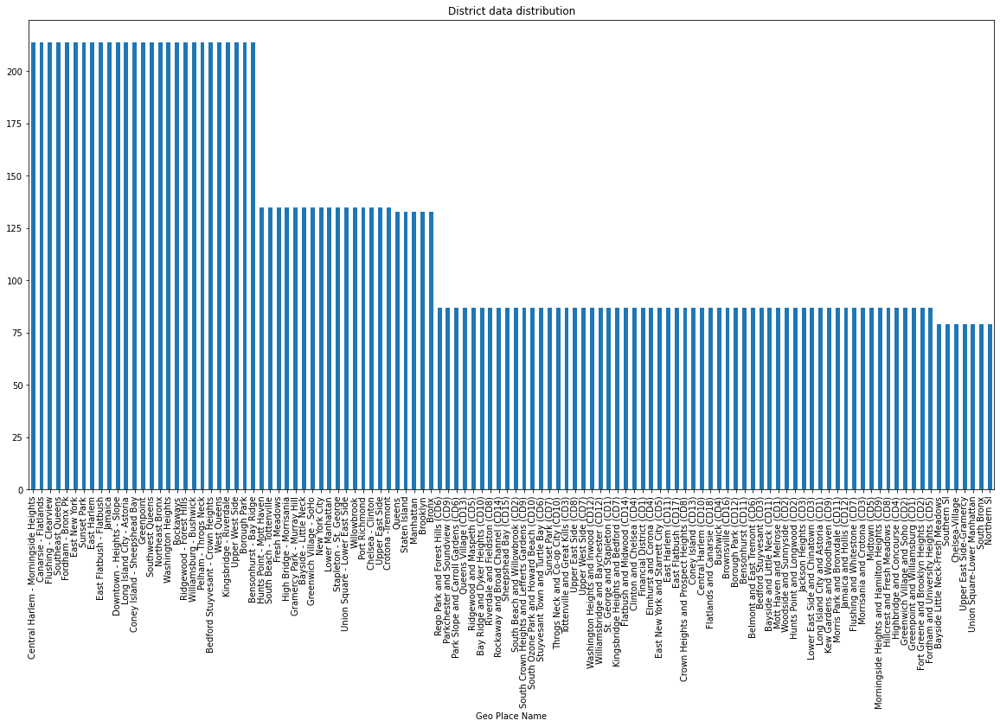

In [27]:
df_air.groupby(['Geo Place Name']).size().sort_values(ascending=False).plot(kind='bar', figsize=(20,10))
plt.title("District data distribution")
plt.show()

For this reason, it will be necessary to decide which variables we want to focus our analysis on. 

In [28]:
# create datetime column
df_air['Date'] = pd.to_datetime(df_air['Start_Date'], format='%M/%d/%Y')

#### Variables behaviour in time for New York City

In the following plot, the average behaviour of every variable in the dataset, averaged in all districts of the city, has been represented. This can be used as a general indicator of the changing through time in air quality in New York.

In [29]:
# Function that allows bokeh plotting in deepnote  
def bokeh_deepnote_show(plot):
    tmp_output_filename = tempfile.NamedTemporaryFile(suffix='.html').name
    output_file(tmp_output_filename)
    save(plot)

    f = open(tmp_output_filename, "r")
    display(HTML(f.read()))

In [30]:
# Visualization of all variables for New York City (whole city)

fig_dict1 = {}
layout_dict = {}
tab_dict = {}

Geo_Place_Name = 'New York City'

output_file(filename="viz1.html", title="Bokeh 1 file")

for Name in set(df_air['Name']):
    fig_dict1[Name] = figure(height=500,width=600,x_axis_type='datetime')
    asthma = df_air[df_air['Name'] == Name].sort_values('Date', axis=0)
    asthma = asthma[asthma['Geo Place Name'] == Geo_Place_Name]
    asthma = asthma[asthma['Name'] == Name]
    source = ColumnDataSource(data=asthma)
    fig_dict1[Name].line(x='Start_Date', 
                         y='Data Value',
                         source=source,
                         width=0.9)
    fig_dict1[Name].circle(x='Start_Date', 
                           y='Data Value',
                           source=source)
    fig_dict1[Name].add_tools(HoverTool(tooltips=[("Data Value", '@{Data Value}'), ("Date", "@Start_Date{%F}")],
                                        formatters={'@Start_Date':'datetime'}))
    fig_dict1[Name].x_range.range_padding = 0.1
    fig_dict1[Name].xgrid.grid_line_color = None
    fig_dict1[Name].axis.minor_tick_line_color = None
    fig_dict1[Name].outline_line_color = None
    title = Name+" - "+Geo_Place_Name
    fig_dict1[Name].title.text = title
    fig_dict1[Name].title.text_font_size = "15px"
    fig_dict1[Name].xaxis.axis_label = 'Date'
    fig_dict1[Name].yaxis.axis_label = df_air[df_air['Name']==Name]['Measure Info'].iloc[0]
    
    layout_dict[Name] = layout([[fig_dict1[Name]]], sizing_mode='stretch_both')

    tab_dict[Name] = Panel(child=layout_dict[Name], title=Name)
    
tabs = Tabs(tabs=list(tab_dict.values()))
curdoc().add_root(tabs)
save(tabs)

bokeh_deepnote_show(tabs)

We can see how the average values of almost every variable have decreased in time in the city, meaning the air quality has improved in the last years.

#### Single variable visualization

In order to analyze the relation between air quality, trees and heath performed in the following section, we decide to focus in the behaviour of two specific representative variables of the air quality in the various districts: the **Fine Particulate Matter (PM2.5)** and the **Sulfur Dioxide (SO2)**.

##### 1. Fine Particulate Matter (PM2.5) behaviour  the NYC districts

In the following plot we can see the behaviour through time in all districts of New York of the Fine Particulate Matter (PM2.5).

In [31]:
# Visualization of all districts for single variable

fig_dict = {}
layout_dict = {}
tab_dict = {}

Name = 'Fine Particulate Matter (PM2.5)'
for Geo_Place_Name in set(df_air['Geo Place Name']):
    fig_dict[Geo_Place_Name] = figure(height=500, width=600,x_axis_type='datetime')
    asthma = df_air[df_air['Name'] == Name].sort_values('Date', axis=0)
    asthma = asthma[asthma['Geo Place Name'] == Geo_Place_Name]
    asthma = asthma[asthma['Name'] == Name]
    source = ColumnDataSource(data=asthma)
    fig_dict[Geo_Place_Name].line(x='Start_Date', 
                                  y='Data Value',
                                  source=source,
                                  width=0.9)
    fig_dict[Geo_Place_Name].circle(x='Start_Date', 
                                    y='Data Value',
                                    source=source)
    fig_dict[Geo_Place_Name].add_tools(HoverTool(tooltips=[("Data Value", '@{Data Value}'), ("Date", "@Start_Date{%F}")],
                                    formatters={'@Start_Date':'datetime'}))
    fig_dict[Geo_Place_Name].x_range.range_padding = 0.1
    fig_dict[Geo_Place_Name].xgrid.grid_line_color = None
    fig_dict[Geo_Place_Name].axis.minor_tick_line_color = None
    fig_dict[Geo_Place_Name].outline_line_color = None

    title = Name+" - "+Geo_Place_Name
    fig_dict[Geo_Place_Name].title.text = title
    fig_dict[Geo_Place_Name].title.text_font_size = "15px"
    fig_dict[Geo_Place_Name].xaxis.axis_label = 'Date'
    fig_dict[Geo_Place_Name].yaxis.axis_label = df_air[df_air['Name']==Name]['Measure Info'].iloc[0]
    
    layout_dict[Geo_Place_Name] = layout([[fig_dict[Geo_Place_Name]]], sizing_mode='stretch_both')

    tab_dict[Geo_Place_Name] = Panel(child=layout_dict[Geo_Place_Name], title=Geo_Place_Name)
    
tabs = Tabs(tabs=list(tab_dict.values()))
curdoc().add_root(tabs)

bokeh_deepnote_show(tabs)

##### 2. Sulfur Dioxide (SO2) behaviour in the NYC districts

The same representation for the Sulfur Dioxide (SO2) is shown below.

In [32]:
# Visualization of all districts for single variable

fig_dict = {}
layout_dict = {}
tab_dict = {}

Name = 'Sulfur Dioxide (SO2)'
for Geo_Place_Name in set(df_air['Geo Place Name']):
    fig_dict[Geo_Place_Name] = figure(height=500, width=600,x_axis_type='datetime')
    asthma = df_air[df_air['Name'] == Name].sort_values('Date', axis=0)
    asthma = asthma[asthma['Geo Place Name'] == Geo_Place_Name]
    asthma = asthma[asthma['Name'] == Name]
    source = ColumnDataSource(data=asthma)
    fig_dict[Geo_Place_Name].line(x='Start_Date', 
                                  y='Data Value',
                                  source=source,
                                  width=0.9)
    fig_dict[Geo_Place_Name].circle(x='Start_Date', 
                                    y='Data Value',
                                    source=source)
    fig_dict[Geo_Place_Name].add_tools(HoverTool(tooltips=[("Data Value", '@{Data Value}'), ("Date", "@Start_Date{%F}")],
                                    formatters={'@Start_Date':'datetime'}))
    fig_dict[Geo_Place_Name].x_range.range_padding = 0.1
    fig_dict[Geo_Place_Name].xgrid.grid_line_color = None
    fig_dict[Geo_Place_Name].axis.minor_tick_line_color = None
    fig_dict[Geo_Place_Name].outline_line_color = None

    title = Name+" - "+Geo_Place_Name
    fig_dict[Geo_Place_Name].title.text = title
    fig_dict[Geo_Place_Name].title.text_font_size = "15px"
    fig_dict[Geo_Place_Name].xaxis.axis_label = 'Date'
    fig_dict[Geo_Place_Name].yaxis.axis_label = df_air[df_air['Name']==Name]['Measure Info'].iloc[0]
    
    layout_dict[Geo_Place_Name] = layout([[fig_dict[Geo_Place_Name]]], sizing_mode='stretch_both')

    tab_dict[Geo_Place_Name] = Panel(child=layout_dict[Geo_Place_Name], title=Geo_Place_Name)
    
tabs = Tabs(tabs=list(tab_dict.values()))
curdoc().add_root(tabs)

bokeh_deepnote_show(tabs)

As we can see by the plots above, the general behaviour indicates the air quality is improving through time, although some districts appear to have very different values that others. To better show these differences, we compare districts in the following section.

### Single variable geographical visualization

In this section the two chosen variables are represented using geographical maps. This allows to better understand the differences between districts in time. 

In [33]:
# Upload the json containing the coordinates of the districts of New York
file = open("./data/geo_files/json/CD.json")
geo = json.load(file)

In [34]:
# Modifying the coordinates by subtstituting the id with the name of the District to show in the map. 
# get_neighbourhood_name is a function implemented at the beginning of this section.
for feature in geo['features']:
    if int(feature['id']) > 0:
        feature['id'] = get_neighbourhood_name(int(feature['id']))

##### 1. Fine Particulate Matter (PM2.5) behaviour in the NYC districts

In [35]:
df_air.columns

Index(['Name', 'Measure', 'Measure Info', 'Geo Join ID', 'Geo Place Name',
       'Data Value', 'Start_Date', 'Year', 'Date'],
      dtype='object')

In [36]:
Name = 'Fine Particulate Matter (PM2.5)'
df_temp = df_air[df_air["Name"] == Name] # select specific Name
measure_info = df_temp['Measure Info'].iloc[0]
df_temp = df_temp.groupby(['Year','Geo Place Name']).mean() # calculate average per year
df_temp = df_temp.reset_index(level=[0,1]) # reset indexes
locations = list(set(df_temp['Geo Place Name'])) # save location names

data=[]
button_settings_list = []
iterator = 0
for year in sorted(set(df_temp['Year']), reverse=True):
    df_sub_temp = df_temp[df_temp['Year']==year]
    data.append(go.Choroplethmapbox(geojson=geo, 
                                    locations=locations, 
                                    z=df_sub_temp['Data Value'],
                                    colorbar=dict(title=dict(text=Name+" - "+measure_info, side="right")),
                                    colorscale="Reds",
                                    zmin=5,
                                    zmax=19
                                    ))
    setting_dict = {}
    visibility_list = [False]*(len(set(df_temp['Year'])))
    visibility_list[iterator] = True
    iterator += 1
    setting_dict['args']=['visible', visibility_list]
    setting_dict['label']=str(year)
    setting_dict['method']='restyle'
    button_settings_list.append(setting_dict)
    
layout_=go.Layout(mapbox_style="carto-positron",
                  mapbox_zoom=9.2, mapbox_center = {"lat": 40.7, "lon": -73.86})
layout_.update(updatemenus=list([
        dict(
            x=-0.05,
            y=1,
            yanchor='top',
            buttons=list(button_settings_list))]))
fig = go.Figure(data=data,layout=layout_)
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})

fig.show()

#### Sulfur Dioxide (SO2) behaviour in the NYC districts

In [37]:
Name = 'Sulfur Dioxide (SO2)'
df_temp = df_air[df_air["Name"] == Name] # select specific Name
measure_info = df_temp['Measure Info'].iloc[0]
df_temp = df_temp.groupby(['Year','Geo Place Name']).mean() # calculate average per year
df_temp = df_temp.reset_index(level=[0,1]) # reset indexes
locations = list(set(df_temp['Geo Place Name'])) # save location names

data=[]
button_settings_list = []
iterator = 0
for year in sorted(set(df_temp['Year']), reverse=True):
    df_sub_temp = df_temp[df_temp['Year']==year]
    data.append(go.Choroplethmapbox(geojson=geo, 
                                    locations=locations, 
                                    z=df_sub_temp['Data Value'],
                                    colorbar=dict(title=dict(text=Name+" - "+measure_info, side="right")),
                                    colorscale="YlOrBr",
                                    zmin=0,
                                    zmax=12
                                    ))
    setting_dict = {}
    visibility_list = [False]*(len(set(df_temp['Year'])))
    visibility_list[iterator] = True
    iterator += 1
    setting_dict['args']=['visible', visibility_list]
    setting_dict['label']=str(year)
    setting_dict['method']='restyle'
    button_settings_list.append(setting_dict)
    
layout_=go.Layout(mapbox_style="carto-positron",
                  mapbox_zoom=9.2, mapbox_center = {"lat": 40.7, "lon": -73.86})
layout_.update(updatemenus=list([
        dict(
            x=-0.05,
            y=1,
            yanchor='top',
            buttons=list(button_settings_list))]))
fig = go.Figure(data=data,layout=layout_)
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})

fig.show()

From the above maps, we can confirm the general trend in time of the two variables is of general improvement. Also, the differences between districts have been reduced.

### Health Data EDA

In [38]:
#See statistic summary
health_statistics=health_data.describe()
health_statistics

,Poverty,Unemployment,Self reported health,Smoking,Avoidable asthma,Life expectancy
count,59.000000,59.000000,59.000000,59.000000,59.000000,59.000000
mean,21.779661,11.016949,77.728814,15.762712,276.813559,80.559322
std,10.506267,4.002118,7.094997,2.973092,209.387158,2.877506
min,6.000000,5.000000,64.000000,10.000000,46.000000,74.100000
25%,13.000000,7.500000,71.000000,13.500000,119.000000,78.750000
50%,20.000000,10.000000,79.000000,16.000000,218.000000,80.900000
75%,29.000000,14.500000,83.000000,18.000000,359.000000,82.700000
max,44.000000,20.000000,92.000000,22.000000,786.000000,85.400000


### Visualization



#### Histograms in ascending order according to Poverty
The vizualisation shows the distribution of all features within the districts of the city. One can already see possible correlations between some of the features as for example poverty, premature death and unemployment. 

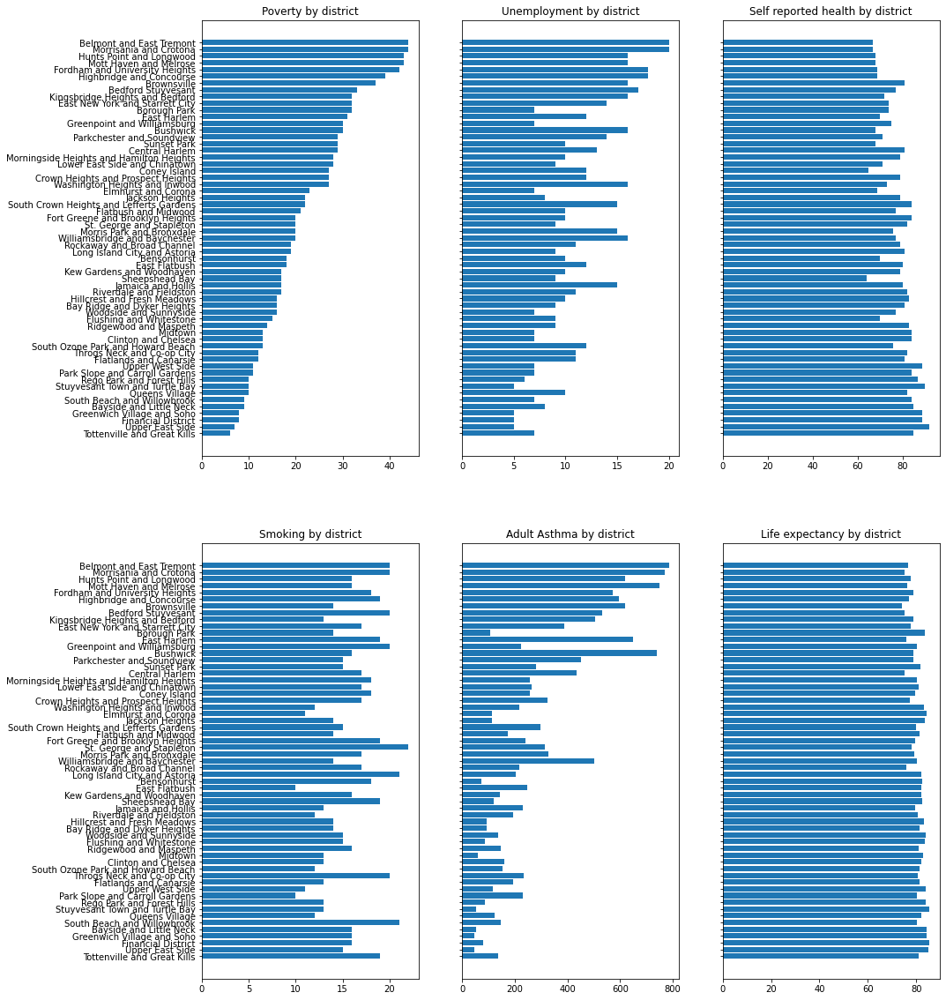

In [39]:
fig, ax=plt.subplots(2,3,figsize=(15,20),sharey=True)
ax=ax.flatten()
ax[0].barh(health_data.sort_values(['Poverty'],
              ascending = [True])["Name"], 
             health_data.sort_values(['Poverty'],
              ascending = [True])["Poverty"])

ax[0].title.set_text("Poverty by district")
#ax[0,0].xlabel("Poverty") # percent of inidividuals living below the federal poverty treshold
#ax[0,0].ylabel("District")

ax[1].barh(health_data["Name"], health_data["Unemployment"])
ax[1].title.set_text("Unemployment by district")

ax[2].barh(health_data["Name"], health_data["Self reported health"])
ax[2].title.set_text("Self reported health by district")

ax[3].barh(health_data["Name"], health_data["Smoking"])
ax[3].title.set_text("Smoking by district")

ax[4].barh(health_data["Name"], health_data["Avoidable asthma"])
ax[4].title.set_text("Adult Asthma by district")

ax[5].barh(health_data["Name"], health_data["Life expectancy"])
ax[5].title.set_text("Life expectancy by district")

plt.show()

#### Density distribution of the Variables across the city
The vizualisation shows the distribution of all features individually. One can see that the density plot does not always follow a normal perfect normal distribution.

In [40]:
def make_plot(title, hist, edges, x, pdf):
    p = figure(title=title, tools='', background_fill_color="#fafafa")
    p.quad(top=hist, bottom=0, left=edges[:-1], right=edges[1:],
           fill_color="navy", line_color="white", alpha=0.5)
    p.line(x, pdf, line_color="#ff8888", line_width=4, alpha=0.7, legend_label="Density")

    p.y_range.start = 0
    p.legend.location = "center_right"
    p.legend.background_fill_color = "#fefefe"
    p.xaxis.axis_label = 'x'
    p.yaxis.axis_label = 'Pr(x)'
    p.grid.grid_line_color="white"
    return p

fig_dict = {}
layout_dict = {}
tab_dict = {}

#rename columns

for Name in health_data.columns[2:]:
    # Normal Distribution
    mu=np.mean(health_data[Name])
    sigma=np.std(health_data[Name])
    hist, edges = np.histogram(health_data[Name], density=True, bins=10)
    x = np.linspace(min(health_data[Name])-5.0, max(health_data[Name])+5.0, 1000)

    density = scipy.stats.gaussian_kde(health_data[Name])
    pdf=density(x)

    p1 = make_plot(f"Normal Distribution (μ={mu}, σ={sigma})", hist, edges, x, pdf)
    p1.add_tools(HoverTool(tooltips=[("Data Value", '@{Data Value}')]))
    title = "Density distribution of "+Name
    p1.title.text = title
    p1.title.text_font_size = "15px"
    p1.xaxis.axis_label = 'Distribution'
    p1.yaxis.axis_label = 'Density'
    fig_dict[Name]=p1

    layout_dict[Name] = layout([fig_dict[Name]], sizing_mode='stretch_both')

    tab_dict[Name] = Panel(child=layout_dict[Name], title=Name)


tabs = Tabs(tabs=list(tab_dict.values()))
curdoc().add_root(tabs)

bokeh_deepnote_show(tabs)

To get a better overview, the density distributions were also visualized as the normalized distributions in one single graph, for better comparison. Here it becomes more clear, that there seem to two subpopulations in the dataset. 

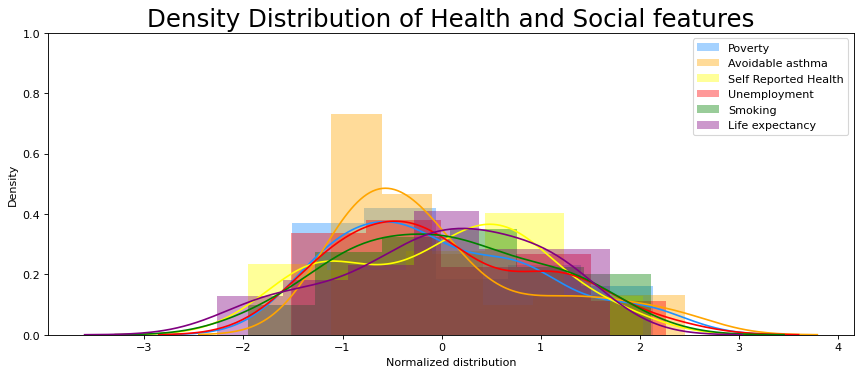

In [41]:
plt.figure(figsize=(13,5), dpi= 80)
ax=sns.distplot((health_data["Poverty"]-np.mean(health_data["Poverty"]))/np.std(health_data["Poverty"]), color="dodgerblue", label="Poverty")
ax=sns.distplot((health_data["Avoidable asthma"]-np.mean(health_data["Avoidable asthma"]))/np.std(health_data["Avoidable asthma"]),color="orange", label="Avoidable asthma")
ax=sns.distplot((health_data["Self reported health"]-np.mean(health_data["Self reported health"]))/np.std(health_data["Self reported health"]), color="yellow", label="Self Reported Health")
ax=sns.distplot((health_data["Unemployment"]-np.mean(health_data["Unemployment"]))/np.std(health_data["Unemployment"]), color="red", label="Unemployment")
ax=sns.distplot((health_data["Smoking"]-np.mean(health_data["Smoking"]))/np.std(health_data["Smoking"]), color="green", label="Smoking")
ax=sns.distplot((health_data["Life expectancy"]-np.mean(health_data["Life expectancy"]))/np.std(health_data["Life expectancy"]), color="purple", label="Life expectancy")

plt.ylim(0, 1)

# Decoration
plt.title('Density Distribution of Health and Social features', fontsize=22)
ax.set(xlabel='Normalized distribution', ylabel='Density')
plt.legend()
plt.show()

#### Ranked top 4 and bottom 4 district according to Poverty

To see how the data within the dataset is related to one another, the top 4 and bottom 4 districts for poverty were compared to their ranking in the other districts.
The vizualisation shows the top 4 and bottom 4 districts for poverty and relating the other features by showing the top 4 places in green and bottom 4 places in red. The visualization shows quite prominently correlations between the social factors and the health of the citizens within the districts.

In [42]:
#ranking the different features
health_data['Poverty_rank']=health_data['Poverty'].rank(method='max')
health_data["Unemployment_rank"]=health_data["Unemployment"].rank(method='max')
health_data["Self_rep_health_rank"]=health_data["Self reported health"].rank(method='max')
health_data["Smoking_rank"]=health_data["Smoking"].rank(method='max')
health_data["Avoidable_Asthma_rank"]=health_data["Avoidable asthma"].rank(method='max')
health_data["Life_expectancy_rate_rank"]=health_data["Life expectancy"].rank(method='max')


health_data_top=health_data.nlargest(4, "Poverty_rank")
health_data_min=health_data.nsmallest(4, "Poverty_rank")
health_data_focus=pd.concat([health_data_top,health_data_min])

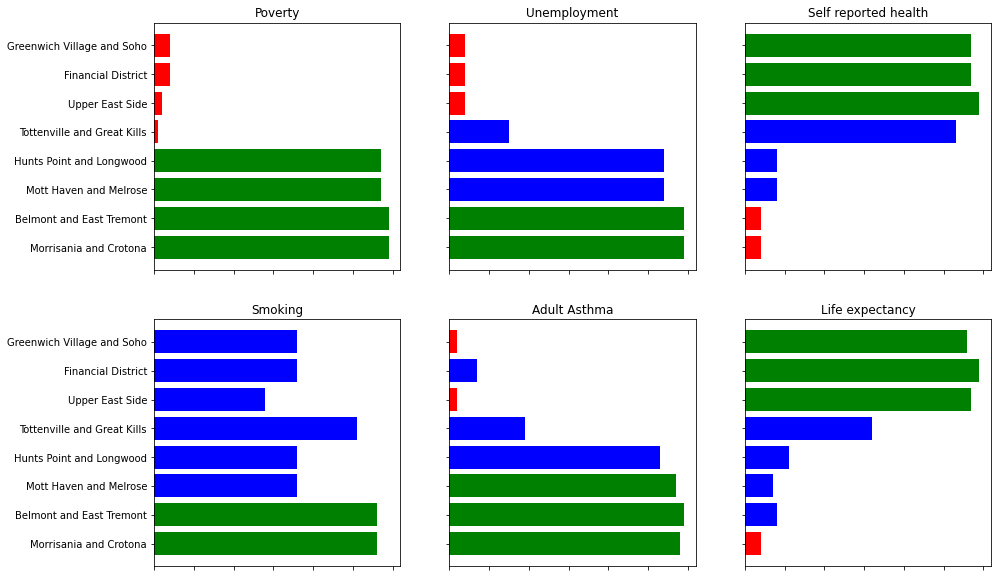

In [43]:
# plotting the top and bottom 4 districts for poverty and relating the other features by ranking the 
# districts and showing the top 4 places in green and bottom 4 places in red
fig, ax=plt.subplots(2,3,figsize=(15,10),sharey=True,sharex=True)
ax=ax.flatten()

colors = []
for value in health_data_focus["Poverty_rank"]: # keys are the names of the boys
    if value>55:
        colors.append('g')
    elif value<=4:
        colors.append('r')
    else:
        colors.append('b')
ax[0].barh(health_data_focus["Name"], health_data_focus["Poverty_rank"],color=colors)
ax[0].title.set_text("Poverty")
ax[0].xaxis.set_ticklabels([])

colors = []
for value in health_data_focus["Unemployment_rank"]: # keys are the names of the boys
    if value>55:
        colors.append('g')
    elif value<=4:
        colors.append('r')
    else:
        colors.append('b')
ax[1].barh(health_data_focus["Name"], health_data_focus["Unemployment_rank"],color=colors)
ax[1].title.set_text("Unemployment")
ax[1].xaxis.set_ticklabels([])

colors = []
for value in health_data_focus["Self_rep_health_rank"]: # keys are the names of the boys
    if value>55:
        colors.append('g')
    elif value<=4:
        colors.append('r')
    else:
        colors.append('b')
ax[2].barh(health_data_focus["Name"], health_data_focus["Self_rep_health_rank"],color=colors)
ax[2].title.set_text("Self reported health")
ax[2].xaxis.set_ticklabels([])

colors = []
for value in health_data_focus["Smoking_rank"]: # keys are the names of the boys
    if value>55:
        colors.append('g')
    elif value<=4:
        colors.append('r')
    else:
        colors.append('b')
ax[3].barh(health_data_focus["Name"], health_data_focus["Smoking_rank"],color=colors)
ax[3].title.set_text("Smoking")
ax[3].xaxis.set_ticklabels([])

colors = []
for value in health_data_focus["Avoidable_Asthma_rank"]: # keys are the names of the boys
    if value>55:
        colors.append('g')
    elif value<=4:
        colors.append('r')
    else:
        colors.append('b')
ax[4].barh(health_data_focus["Name"], health_data_focus["Avoidable_Asthma_rank"],color=colors)
ax[4].title.set_text("Adult Asthma")
ax[4].xaxis.set_ticklabels([])

colors = []
for value in health_data_focus["Life_expectancy_rate_rank"]: # keys are the names of the boys
    if value>55:
        colors.append('g')
    elif value<=4:
        colors.append('r')
    else:
        colors.append('b')
ax[5].barh(health_data_focus["Name"], health_data_focus["Life_expectancy_rate_rank"],color=colors)
ax[5].title.set_text("Life expectancy")
ax[5].xaxis.set_ticklabels([])

plt.show()

#### Pairwise plots

The comparison of the ranking let us assume correlations between different features. This is confirmed in the pairwise plots, where some of the variables show very linear correlations.

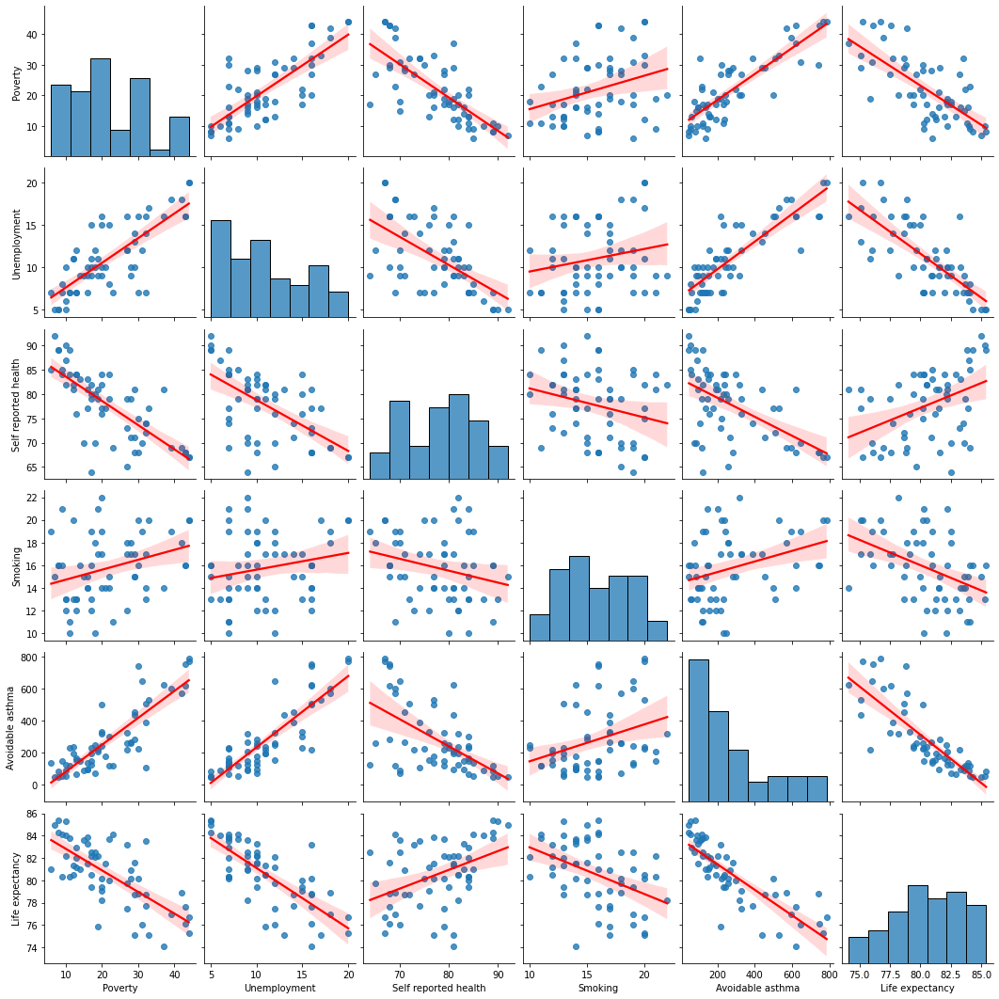

In [44]:
g=sns.pairplot(health_data.iloc[:,:8],kind="reg",plot_kws={'line_kws':{'color':'red'}})
plt.show()

#### Correlation of individual variables

Looking at the behaviour of the two variables `Avoidable asthma`and `Life expectancy`, plotted against all remaining variables, it becomes evident that social features such as `Poverty`and `Unemployment` seem to have a big impact on the health of the citizens.

In [45]:
def regression_line(x,y):
    a=(sum(x[k]*y[k] for k in range(len(x)))-len(x)*np.mean(y)*np.mean(x))/(sum(x[k]**2 for k in range(len(x)))-len(x)*np.mean(x)**2)
    b=np.mean(y)-np.mean(x)*a
    y_hand=b+a*x
    return y_hand

In [46]:
#normalize values to plot in one graph
for i in health_data.columns[2:8]:
    name=i+"_norm"
    health_data[name] = [number/scipy.linalg.norm(health_data[i]) for number in health_data[i]]

data=[]
#avoidable asthma on x axis
data.append(go.Scatter(name="Poverty",x=health_data["Avoidable asthma_norm"], y=health_data["Poverty_norm"],mode="markers",marker={'color':'blue'}))
data.append(go.Scatter(name="Unemployment",x=health_data["Avoidable asthma_norm"], y=health_data["Unemployment_norm"],mode="markers",marker={'color':'red'}))
data.append(go.Scatter(name="Self reported health",x=health_data["Avoidable asthma_norm"], y=health_data["Self reported health_norm"],mode="markers",marker={'color':'green'}))
data.append(go.Scatter(name="Smoking",x=health_data["Avoidable asthma_norm"], y=health_data["Smoking_norm"],mode="markers",marker={'color':'orange'}))
data.append(go.Scatter(name="Life expectancy",x=health_data["Avoidable asthma_norm"], y=health_data["Life expectancy_norm"],mode="markers",marker={'color':'purple'}))

data.append(go.Scatter(x=np.array(health_data["Avoidable asthma_norm"]), y=regression_line(np.array(health_data["Avoidable asthma_norm"]),np.array(health_data["Poverty_norm"])),mode="lines",showlegend=False,line= dict(color="blue")))
data.append(go.Scatter(x=np.array(health_data["Avoidable asthma_norm"]), y=regression_line(np.array(health_data["Avoidable asthma_norm"]),np.array(health_data["Unemployment_norm"])),mode="lines",showlegend=False,line= dict(color="red")))
data.append(go.Scatter(x=np.array(health_data["Avoidable asthma_norm"]), y=regression_line(np.array(health_data["Avoidable asthma_norm"]),np.array(health_data["Self reported health_norm"])),mode="lines",showlegend=False,line= dict(color="green")))
data.append(go.Scatter(x=np.array(health_data["Avoidable asthma_norm"]), y=regression_line(np.array(health_data["Avoidable asthma_norm"]),np.array(health_data["Smoking_norm"])),mode="lines",showlegend=False,line= dict(color="orange")))
data.append(go.Scatter(x=np.array(health_data["Avoidable asthma_norm"]), y=regression_line(np.array(health_data["Avoidable asthma_norm"]),np.array(health_data["Life expectancy_norm"])),mode="lines",showlegend=False,line= dict(color="purple")))

#life expectancy on x axis
data.append(go.Scatter(name="Poverty",x=health_data["Life expectancy_norm"], y=health_data["Poverty_norm"],mode="markers",marker={'color':'blue'}))
data.append(go.Scatter(name="Unemployment",x=health_data["Life expectancy_norm"], y=health_data["Unemployment_norm"],mode="markers",marker={'color':'red'}))
data.append(go.Scatter(name="Self reported health",x=health_data["Life expectancy_norm"], y=health_data["Self reported health_norm"],mode="markers",marker={'color':'green'}))
data.append(go.Scatter(name="Smoking",x=health_data["Life expectancy_norm"], y=health_data["Smoking_norm"],mode="markers",marker={'color':'orange'}))
data.append(go.Scatter(name="Avoidable asthma",x=health_data["Life expectancy_norm"], y=health_data["Avoidable asthma_norm"],mode="markers",marker={'color':'purple'}))

data.append(go.Scatter(x=np.array(health_data["Life expectancy_norm"]), y=regression_line(np.array(health_data["Life expectancy_norm"]),np.array(health_data["Poverty_norm"])),mode="lines",showlegend=False,line= dict(color="blue")))
data.append(go.Scatter(x=np.array(health_data["Life expectancy_norm"]), y=regression_line(np.array(health_data["Life expectancy_norm"]),np.array(health_data["Unemployment_norm"])),mode="lines",showlegend=False,line= dict(color="red")))
data.append(go.Scatter(x=np.array(health_data["Life expectancy_norm"]), y=regression_line(np.array(health_data["Life expectancy_norm"]),np.array(health_data["Self reported health_norm"])),mode="lines",showlegend=False,line= dict(color="green")))
data.append(go.Scatter(x=np.array(health_data["Life expectancy_norm"]), y=regression_line(np.array(health_data["Life expectancy_norm"]),np.array(health_data["Smoking_norm"])),mode="lines",showlegend=False,line= dict(color="orange")))
data.append(go.Scatter(x=np.array(health_data["Life expectancy_norm"]), y=regression_line(np.array(health_data["Life expectancy_norm"]),np.array(health_data["Avoidable asthma_norm"])),mode="lines",showlegend=False,line= dict(color="purple")))

for i in range(10):
    data[i]['visible']=True
for i in range(10,20):
    data[i]['visible']=False

layout_=go.Layout(
    xaxis=dict(showticklabels=False),
    yaxis=dict(showticklabels=False))

layout_.update(updatemenus=list([
        dict(
            x=0.6,
            y=1.1,
            yanchor='top',
            buttons=list([
                dict(
                    args=['visible', [True,True,True,True,True,True,True,True,True,True,False,False,False,False,False,False,False,False,False,False]],
                    label='Avoidable Asthma',
                    method='restyle'
                ),
                dict(
                    args=['visible', [False,False,False,False,False,False,False,False,False,False, True,True,True,True,True,True,True,True,True,True]],
                    label='Life expectancy',
                    method='restyle')]))]))

fig=go.Figure(data=data, layout=layout_)
fig.show()

#### Geographical Visualizations

Showing the distribution of health and social aspects on the map of New York City, one can see "hotspot" areas of poorer health and less wealth.

In [47]:
geodata =  json.load(open('./data/geo_files/json/CD.json', 'r'))

In [48]:
data1=[]
data1.append(go.Choroplethmapbox(geojson=geodata, 
                                    locations=health_data["ID"], 
                                    z=health_data['Poverty'],
                                    colorbar=dict(title='Poverty <br>(% below minimum)'),
                                    colorscale="sunset",
                                    hovertext=health_data["Name"],
                                    hoverinfo="text"
                                    ))
data1.append(go.Choroplethmapbox(geojson=geodata, 
                                    locations=health_data["ID"], 
                                    z=health_data['Avoidable asthma'],
                                    colorbar=dict(title='Avoidable <br> Asthma <br> (nr. persons)'),
                                    colorscale="sunset",
                                    hovertext=health_data["Name"],
                                    hoverinfo="text"
                                    ))
data1.append(go.Choroplethmapbox(geojson=geodata, 
                                    locations=health_data["ID"], 
                                    z=health_data['Self reported health'],
                                    colorbar=dict(title='Self reported <br> health (%)'),
                                    colorscale="sunset",
                                    hovertext=health_data["Name"],
                                    hoverinfo="text"
                                    ))
data1.append(go.Choroplethmapbox(geojson=geodata, 
                                    locations=health_data["ID"], 
                                    z=health_data['Smoking'],
                                    colorbar=dict(title='Smoking (%)'),
                                    colorscale="sunset",
                                    hovertext=health_data["Name"],
                                    hoverinfo="text"
                                    ))
data1.append(go.Choroplethmapbox(geojson=geodata, 
                                    locations=health_data["ID"], 
                                    z=health_data['Life expectancy'],
                                    colorbar=dict(title='Life expectancy <br>(age)'),
                                    colorscale="sunset",
                                    hovertext=health_data["Name"],
                                    hoverinfo="text"
                                    ))
data1[0]['visible']=True
data1[1]['visible']=False
data1[2]['visible']=False
data1[3]['visible']=False
data1[4]['visible']=False

layout_=go.Layout(mapbox_style="carto-positron",
                  mapbox_zoom=9, mapbox_center = {"lat": 40.7, "lon": -73.86})

#dropdown code from https://plot.ly/~empet/15237/choroplethmapbox-with-dropdown-menu/#/
layout_.update(updatemenus=list([
        dict(
            x=1,
            y=1,
            yanchor='top',
            buttons=list([
                dict(
                    args=['visible', [True, False,False,False,False]],
                    label='Poverty',
                    method='restyle'
                ),
                dict(
                    args=['visible', [False, True, False,False,False]],
                    label='Avoidable Asthma',
                    method='restyle'
                ),
                dict(
                    args=['visible', [False,False, True,False,False]],
                    label='Self reported health',
                    method='restyle'),
                dict(
                    args=['visible', [False,False, False,True,False]],
                    label='Smoking',
                    method='restyle'),
                dict(
                    args=['visible', [False,False, False,False,True]],
                    label='Life expectancy',
                    method='restyle')]))]))
fig = go.Figure(data=data1,layout=layout_)
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

### Trees Data EDA

In [49]:
df_counts.describe()

,cb_num,count_2015,count_2005,count_1995,area_km2,counts_per_km2_2015,counts_per_km2_2005,counts_per_km2_1995,parkarea [km^2],park_percent
count,58.000000,58.000000,58.000000,58.000000,58.000000,58.000000,58.000000,58.000000,58.000000,58.000000
mean,281.637931,11164.827586,9625.724138,7752.448276,129.963051,94.772573,76.447669,60.652911,2.017559,0.014526
std,119.360386,8960.729106,8995.275342,7447.358790,120.226017,26.507166,28.861290,28.592082,2.826620,0.015680
min,101.000000,2031.000000,1562.000000,362.000000,37.721691,41.995808,26.870819,5.851923,0.033678,0.000410
25%,204.250000,5102.250000,3605.500000,2791.000000,53.763588,76.559904,55.749671,37.067202,0.294746,0.004897
50%,306.500000,8945.000000,7518.500000,5518.000000,86.827234,94.409587,73.192129,58.684275,1.002113,0.009655
75%,402.750000,11868.250000,10255.500000,9495.750000,155.276134,113.892158,95.301124,76.314408,2.412905,0.019022
max,503.000000,51843.000000,49895.000000,37864.000000,598.980258,161.248283,152.651998,143.951813,13.929662,0.089274


On average, the tree density increased from 1995 to 2015 (from 54 to 95 tree/km2)

**But are there districts where the tree count decreased? We check 2005 to 2015**

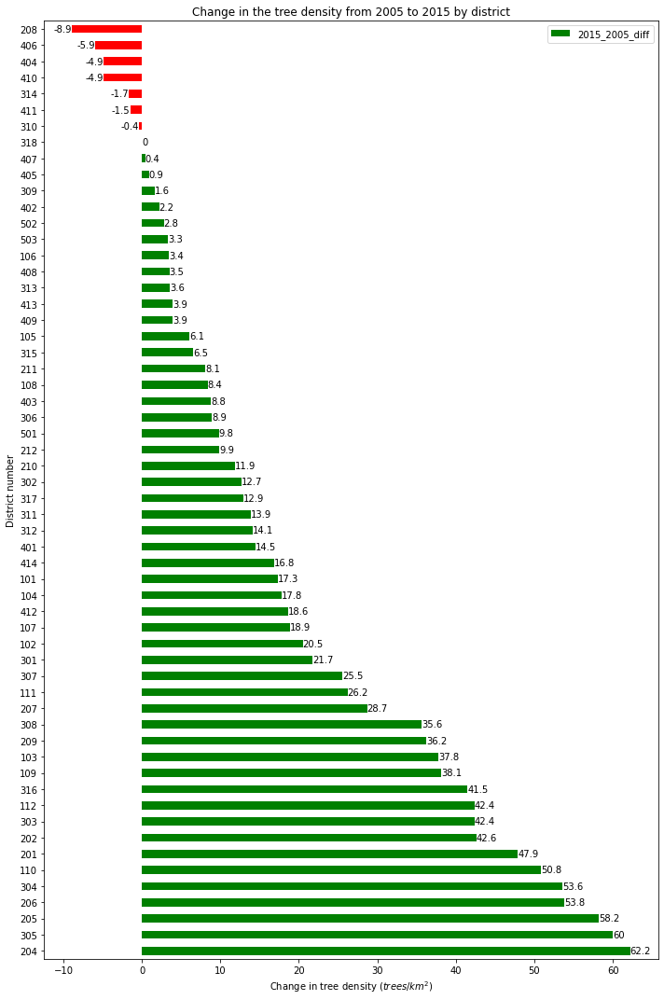

In [50]:
df_counts_dis = df_counts.copy()
df_counts_dis["2015_2005_diff"] = df_counts_dis.counts_per_km2_2015 - df_counts_dis.counts_per_km2_2005
df_counts_dis = df_counts_dis.sort_values(by="2015_2005_diff", ascending=False)
df_counts_dis = df_counts_dis.dropna()
colors = ["red" if x < 0 else "green" for x in df_counts_dis["2015_2005_diff"]]
df_counts_dis["2015_2005_diff"] =np.round(df_counts_dis["2015_2005_diff"], 1)
ax = df_counts_dis.plot.barh(x="cb_num", y="2015_2005_diff", figsize=(10,15), color=colors)
ax.bar_label(ax.containers[0])

ax.set_title("Change in the tree density from 2005 to 2015 by district")
ax.set_ylabel("District number")
ax.set_xlabel(f"Change in tree density $(trees/km^2)$")
plt.tight_layout()
plt.show()

**Only 7 districts have experienced a decrease in tree density from 2005 to 2015. 4 of which are located in Queens, 2 in Brooklyn, and 1 in Bronx.**

Note however that by this metrics, it is more difficult to increase the trees/km2 for large areas: more trees need to be planted to have a larger number in bigger areas. Nonetheless, the tree count per unit area is a standard measure in environmental science and it is pretty descriptive, hence why it is used here.

In [51]:
file = open("./data/geo_files/json/community_districts_updated.geojson")
geo = json.load(file)

In [52]:
df_trees_2015_cln.head()

,tree_id,block_id,created_at,tree_dbh,stump_diam,curb_loc,status,health,spc_latin,spc_common,...,st_assem,st_senate,nta,nta_name,boro_ct,state,latitude,longitude,x_sp,y_sp
0,606945,305778,2016-06-28,10,0,OnCurb,Alive,Good,Fraxinus pennsylvanica,green ash,...,25,14,QN37,Kew Gardens Hills,4125700,New York,40.724339,-73.805180,1.038250e+06,203232.9417
1,160321,341273,2015-08-19,9,0,OnCurb,Alive,Good,Gleditsia triacanthos var. inermis,honeylocust,...,34,13,QN28,Jackson Heights,4030902,New York,40.756626,-73.894167,1.013571e+06,214953.6472
2,541347,325281,2015-12-30,7,0,OnCurb,Alive,Good,Pyrus calleryana,Callery pear,...,32,10,QN76,Baisley Park,4028800,New York,40.679777,-73.788463,1.042923e+06,187008.2671
3,613930,203822,2016-07-05,10,0,OnCurb,Alive,Good,Pyrus calleryana,Callery pear,...,46,22,BK31,Bay Ridge,3005000,New York,40.622743,-74.037543,9.738279e+05,166160.5847
4,18353,338911,2015-06-13,4,0,OnCurb,Alive,Good,Prunus virginiana,'Schubert' chokecherry,...,31,10,QN12,Hammels-Arverne-Edgemere,4095400,New York,40.596514,-73.797622,1.040452e+06,156667.5017


In [53]:
#Plot maps using plotly
#Unknown tree locations arejson dropped
data=[]
data.append(go.Choroplethmapbox(geojson=geodata, 
                                    locations=df_trees_1995_cln.cb_num.value_counts().index, 
                                    z=df_trees_1995_cln.nta_2010.value_counts().values,
                                    colorbar=dict(title='1995'),
                                    colorscale="YlGn",
                                    zmin=0,
                                    zmax=14000
                                    ))
data.append(go.Choroplethmapbox(geojson=geodata, 
                                    locations=df_trees_2005_cln.cb_num.value_counts().index, 
                                    z=df_trees_2005_cln.nta.value_counts().values,
                                    colorbar=dict(title='2005'),
                                    colorscale="YlGn",
                                    zmin=0,
                                    zmax=14000
                                    ))
data.append(go.Choroplethmapbox(geojson=geodata, 
                                    locations=df_trees_2015_cln.cb_num.value_counts().index, 
                                    z=df_trees_2015_cln.nta.value_counts().values,
                                    colorbar=dict(title='2015'),
                                    colorscale="YlGn",
                                    zmin=0,
                                    zmax=14000
                                    ))
data[0]['visible']=False
data[1]['visible']=False
data[2]['visible']=True
layout_=go.Layout(mapbox_style="carto-positron",
                  mapbox_zoom=9, mapbox_center = {"lat": 40.7, "lon": -73.86})
#dropdown code from https://plot.ly/~empet/15237/choroplethmapbox-with-dropdown-menu/#/
layout_.update(updatemenus=list([
        dict(
            x=-0.05,
            y=1,
            yanchor='top',
            buttons=list([
                dict(
                    args=['visible', [True, False,False]],
                    label='Year: 1995',
                    method='restyle'
                ),
                dict(
                    args=['visible', [False, True, False]],
                    label='Year: 2005',
                    method='restyle'
                ),
                dict(
                    args=['visible', [False,False, True]],
                    label='Year: 2015',
                    method='restyle')]))]))
fig = go.Figure(data=data,layout=layout_)
fig.update_layout(margin={"r":0,"t":50,"l":0,"b":0}, title_text="Tree Count by NY District", title_x=0.5)
fig.show()

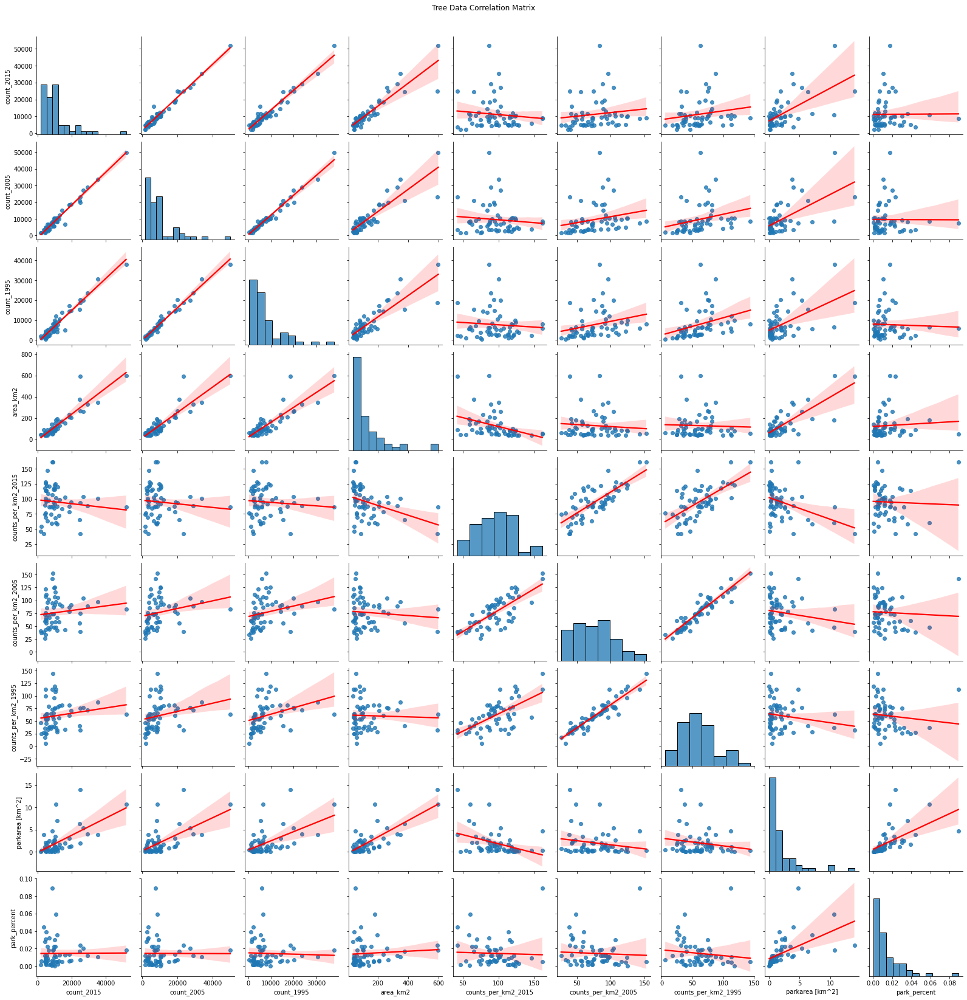

In [54]:
g = sns.pairplot(df_counts.iloc[:,1:], kind="reg",plot_kws={'line_kws':{'color':'red'}})
g.fig.suptitle("Tree Data Correlation Matrix", y=1.02)
plt.show()

* Larger districts tend to have more trees (the tree counts and areas are positively correlated)

* The tree density is negatively correlated with area, which is expected (higher area leads to lower density) 

* The tree density is slightly negatively correlated with tree counts. This is unexpected, as higher tree counts should lead to higher densities. This could be due to the fact that tree counts and areas are highly correlated, so when they are divided, the area is the dominant variable, which will push the density correlation down negatively.

**Change of trees from 2005 to 2015.**

In general, the tree counts have increased in NY over the years, but is this increase equal in all districts? Or did some districts have actual reduction in the tree counts? We investigate this question below.

In [55]:
nta_count_2005=pd.DataFrame(df_trees_2005_cln.cb_num.value_counts()).reset_index()
nta_count_2015=pd.DataFrame(df_trees_2015_cln.cb_num.value_counts()).reset_index()
nta_count_diff=nta_count_2015.merge(nta_count_2005, on='index')
nta_count_diff['change']=nta_count_diff['cb_num_x']-nta_count_diff['cb_num_y']


In [56]:
data=[]
data.append(go.Choroplethmapbox(geojson=geodata ,
                                    locations=df_trees_2015_cln.cb_num.value_counts().index, 
                                    z=nta_count_diff.change.values,
                                    colorbar=dict(title='2015-2005 Change'),
                                    colorscale=[[0, "red"],
                                                [0.15,'yellow'],
                                               [1, "green"]]
                                    ))

layout_=go.Layout(mapbox_style="carto-positron",
                  mapbox_zoom=9, mapbox_center = {"lat": 40.7, "lon": -73.86})


fig = go.Figure(data=data,layout=layout_)
fig.update_layout(margin={"r":0,"t":50,"l":0,"b":0}, title_text="Change in tree count from 2005 to 2015", title_x=0.5)
fig.show()

Not all districts fared well here. There are red and orange districts in which the tree counts decreased from 2005 and 2015. These areas are known to be poor. The rich Manhatten districts still managed to modesty increase the number of trees, despite the massive urban expansion there. This hints at the link between the SOE factors and well-being outcomes.

#### Density tree plots

We explore the tree density in NY, first by each $km^2$, then by each district.

In [57]:
def to_cartesian(latlon):
    """
    Convert lat-lon data into cartesian
    """
    lat,lon = np.radians(latlon.T)
    clat = np.cos(lat)
    return R*np.column_stack([clat*np.cos(lon), clat*np.sin(lon), np.sin(lat)])

def density_estimate(coords, k, extent, grid_res=300, logscale=True, q=0.99, year=None):
    from matplotlib.colors import LogNorm
    from scipy.spatial import cKDTree as KDTree
    tree = KDTree(to_cartesian(coords))
    x0,x1,y0,y1 = extent
    dx = (x1-x0)/grid_res
    dy = (y1-y0)/grid_res
    g = np.moveaxis(np.mgrid[x0:x1:dx,y0:y1:dy], 0, -1)
    r = tree.query(to_cartesian(g.reshape(-1,2)), k, workers=-1)[0][:,-1]
    d = (k/np.pi)*r**-2
    d = d.reshape(*g.shape[:-1])
    
    if logscale:
        norm = LogNorm()
    else:
        norm = None
    plt.figure(figsize=[20,14])
    plt.imshow(d, origin='lower', extent=(y0,y1,x0,x1), vmax=np.quantile(d, q), aspect='auto', norm=norm, cmap=plt.cm.inferno)
    plt.colorbar()
    if year == None:
        plt.title("Density estimate of trees recorded in NYC tree census, in trees / km$^2$")
    else:
        plt.title(f"{year}: Density estimate of trees recorded in NYC tree census, in trees / km$^2$")
    plt.grid(False)

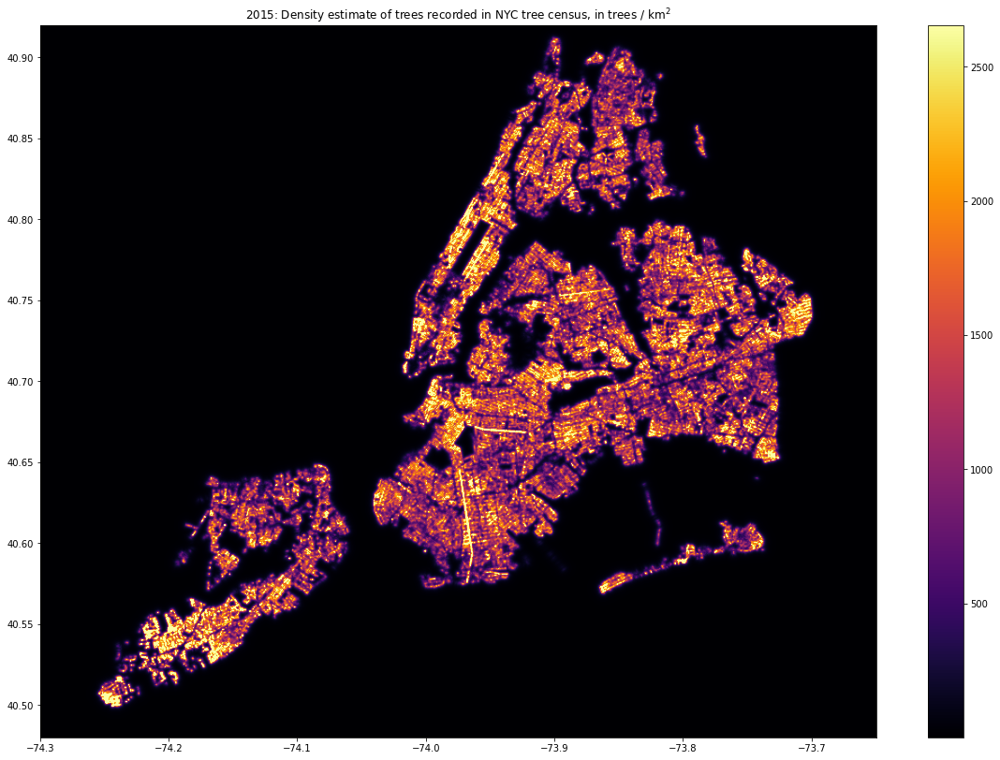

In [58]:
#2015
density_estimate(df_trees_2015_cln[['latitude', 'longitude']].dropna().values, 25, [40.48,40.92,-74.3,-73.65], grid_res=800, logscale=False, year=2015)

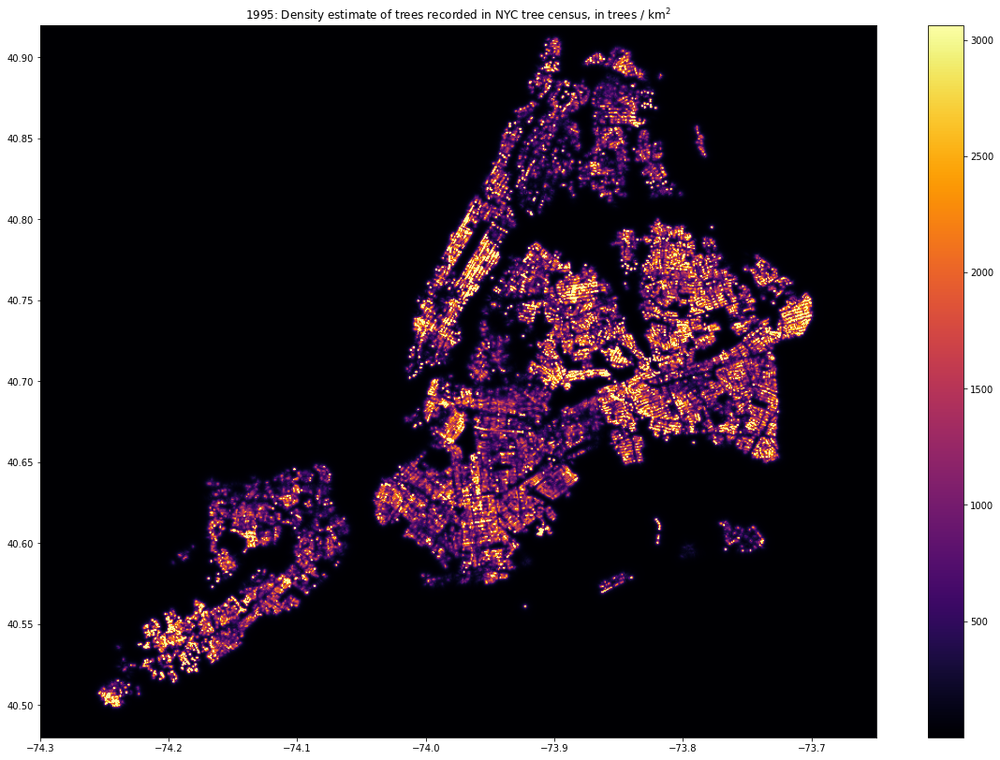

In [59]:
#1995
density_estimate(df_trees_1995[['latitude', 'longitude']].dropna().values, 25, [40.48,40.92,-74.3,-73.65], grid_res=800, logscale=False, year=1995)

In general, the tree density increased in NYC from 1995 to 2015. 

In [60]:
#Plot maps using plotly
data=[]
data.append(go.Choroplethmapbox(geojson=geodata, 
                                    locations=df_counts.cb_num, 
                                    z=df_counts.counts_per_km2_1995,
                                    colorbar=dict(title='1995'),
                                    colorscale="YlGn",
                                    zmin=0,
                                    zmax=170
                                    ))
data.append(go.Choroplethmapbox(geojson=geodata, 
                                    locations=df_counts.cb_num,
                                    z=df_counts.counts_per_km2_2005,
                                    colorbar=dict(title='2005'),
                                    colorscale="YlGn",
                                    zmin=0,
                                    zmax=170
                                    ))
data.append(go.Choroplethmapbox(geojson=geodata, 
                                    # locations=df_trees_2015_cln.cb_num.value_counts().index, 
                                    # z=df_trees_2015_cln.nta.value_counts().values,
                                    locations=df_counts.cb_num,
                                    z=df_counts.counts_per_km2_2015,
                                    colorbar=dict(title='2015'),
                                    colorscale="YlGn",
                                    zmin=0,
                                    zmax=170
                                    ))
data[0]['visible']=False
data[1]['visible']=False
data[2]['visible']=True
layout_=go.Layout(mapbox_style="carto-positron",
                  mapbox_zoom=9, mapbox_center = {"lat": 40.7, "lon": -73.86})
#dropdown code from https://plot.ly/~empet/15237/choroplethmapbox-with-dropdown-menu/#/
layout_.update(updatemenus=list([
        dict(
            x=-0.05,
            y=1,
            yanchor='top',
            buttons=list([
                dict(
                    args=['visible', [True, False,False]],
                    label='Year: 1995',
                    method='restyle'
                ),
                dict(
                    args=['visible', [False, True, False]],
                    label='Year: 2005',
                    method='restyle'
                ),
                dict(
                    args=['visible', [False,False, True]],
                    label='Year: 2015',
                    method='restyle')]))]))
fig = go.Figure(data=data,layout=layout_)
fig.update_layout(margin={"r":0,"t":50,"l":0,"b":0}, title_text="Tree Density by NY District", title_x=0.5)
fig.show()

Again, the richer areas (particualrly Manhatten) seems to have a high tree density. One could argue that those districts have small areas, but when compared to other small districts, the richer districts have better tree density in general.

### Combined Data EDA

In order to make precistion and find out if there is a correlation between trees in the city and health of the citizens, the data needs to be combined and compared.

#### Merging Data

Two variables are chosen for further analyses from the air dataset: **Fine Particulate Matter (PM2.5)**, calculated using **mcg per cubic meter** and **Sulfur Dioxide (SO2)** measured in **ppb**.

In [61]:
# Merging the four datasets in one
df_final = pd.concat([df_tree_merge, df_air_merge, df_health_merge], axis=1, join="inner") #df_trees, 
df_final['Geo Place Name'] = pd.Series(id_neighbourhood_dict)
df_final.head(3)

,count_2015,count_2005,count_1995,area_km2,counts_per_km2_2015,counts_per_km2_2005,counts_per_km2_1995,parkarea [km^2],park_percent,Fine Particulate Matter (PM2.5),Sulfur Dioxide (SO2),Poverty,Unemployment,Self reported health,Smoking,Avoidable asthma,Life expectancy,Geo Place Name
101,2297.0,1562.0,1040.0,42.527843,54.011675,36.728879,24.454568,0.240112,0.005646,10.453444,2.812500,8.0,5.0,89.0,16.0,80.0,85.4,Financial District (CD1)
102,4833.0,4061.0,3751.0,37.721691,128.122571,107.656893,99.438809,0.115288,0.003056,10.278444,3.043333,8.0,5.0,89.0,16.0,46.0,84.3,Greenwich Village and Soho (CD2)
103,4709.0,2938.0,2568.0,46.906822,100.390515,62.634812,54.746834,0.449222,0.009577,10.189444,4.090833,28.0,9.0,71.0,17.0,265.0,80.9,Lower East Side and Chinatown (CD3)


#### Density distribution of all data

In [62]:
#define the columns that we want to see the density from
df_dens_plot=df_final.copy()
df_dens_plot=df_dens_plot.drop(['count_2005','count_1995','counts_per_km2_2005','counts_per_km2_1995','Geo Place Name'],axis=1)
df_dens_plot.rename(columns = {'count_2015':'Tree count 2015', 'counts_per_km2_2015':'Tree density 2015 (counts pr km2)','parkarea [km^2]':'Parkarea [km2]','area_km2':'Area [km2]','park_percent':'Park percentage'}, inplace = True)
df_dens_plot.columns

Index(['Tree count 2015', 'Area [km2]', 'Tree density 2015 (counts pr km2)',
       'Parkarea [km2]', 'Park percentage', 'Fine Particulate Matter (PM2.5)',
       'Sulfur Dioxide (SO2)', 'Poverty', 'Unemployment',
       'Self reported health', 'Smoking', 'Avoidable asthma',
       'Life expectancy'],
      dtype='object')

In [63]:
#make the plot
def make_plot(title, hist, edges, x, pdf):
    p = figure(title=title, tools='', background_fill_color="#fafafa")
    p.quad(top=hist, bottom=0, left=edges[:-1], right=edges[1:],
           fill_color="navy", line_color="white", alpha=0.5)
    p.line(x, pdf, line_color="#ff8888", line_width=4, alpha=0.7, legend_label="Density")

    p.y_range.start = 0
    p.legend.location = "center_right"
    p.legend.background_fill_color = "#fefefe"
    p.xaxis.axis_label = 'x'
    p.yaxis.axis_label = 'Pr(x)'
    p.grid.grid_line_color="white"
    return p

fig_dict = {}
layout_dict = {}
tab_dict = {}

#rename columns

for Name in df_dens_plot.columns[1:]:
    # Normal Distribution
    mu=np.mean(df_dens_plot[Name])
    sigma=np.std(df_dens_plot[Name])
    hist, edges = np.histogram(df_dens_plot[Name], density=True, bins=10)
    x = np.linspace(min(df_dens_plot[Name])-5.0, max(df_dens_plot[Name])+5.0, 1000)

    density = scipy.stats.gaussian_kde(df_dens_plot[Name])
    pdf=density(x)

    p1 = make_plot(f"Normal Distribution (μ={mu}, σ={sigma})", hist, edges, x, pdf)
    title = "Density distribution of "+Name
    p1.title.text = title
    p1.title.text_font_size = "15px"
    p1.xaxis.axis_label = 'Distribution'
    p1.yaxis.axis_label = 'Density'
    fig_dict[Name]=p1

    layout_dict[Name] = layout([fig_dict[Name]], sizing_mode='stretch_both')

    tab_dict[Name] = Panel(child=layout_dict[Name], title=Name)


tabs = Tabs(tabs=list(tab_dict.values()))
curdoc().add_root(tabs)

bokeh_deepnote_show(tabs)

# Correlation between airquality, health and tree density

After exploring the data, the next analysis looks at the correlation between the variables from the different datasets. It uses the Poisson and the R2 value as an indicator of correlation and how big the influence of one variable is on the other.

## Correlation Matrices

In [64]:
#This code was modified from: https://github.com/dylan-profiler/heatmaps/blob/master/heatmap/heatmap.py
#by Drazen Zaric
def heatmap(x, y, **kwargs):
    #caching.clear_cache()
    if 'color' in kwargs:
        color = kwargs['color']
    else:
        color = [1]*len(x)

    if 'palette' in kwargs:
        palette = kwargs['palette']
        n_colors = len(palette)
    else:
        n_colors = 256 # Use 256 colors for the diverging color palette
        palette = sns.color_palette("Blues", n_colors) 

    if 'color_range' in kwargs:
        color_min, color_max = kwargs['color_range']
    else:
        color_min, color_max = min(color), max(color) # Range of values that will be mapped to the palette, i.e. min and max possible correlation

    def value_to_color(val):
        if color_min == color_max:
            return palette[-1]
        else:
            val_position = float((val - color_min)) / (color_max - color_min) # position of value in the input range, relative to the length of the input range
            val_position = min(max(val_position, 0), 1) # bound the position betwen 0 and 1
            ind = int(val_position * (n_colors - 1)) # target index in the color palette
            return palette[ind]

    if 'size' in kwargs:
        size = kwargs['size']
    else:
        size = [1]*len(x)

    if 'size_range' in kwargs:
        size_min, size_max = kwargs['size_range'][0], kwargs['size_range'][1]
    else:
        size_min, size_max = min(size), max(size)

    size_scale = kwargs.get('size_scale', 500)

    def value_to_size(val):
        if size_min == size_max:
            return 1 * size_scale
        else:
            val_position = (val - size_min) * 0.99 / (size_max - size_min) + 0.01 # position of value in the input range, relative to the length of the input range
            val_position = min(max(val_position, 0), 1) # bound the position betwen 0 and 1
            return val_position * size_scale
    if 'x_order' in kwargs: 
        x_names = [t for t in kwargs['x_order']]
    else:
        x_names = [t for t in sorted(set([v for v in x]))]
    x_to_num = {p[1]:p[0] for p in enumerate(x_names)}

    if 'y_order' in kwargs: 
        y_names = [t for t in kwargs['y_order']]
    else:
        y_names = [t for t in sorted(set([v for v in y]))]
    y_to_num = {p[1]:p[0] for p in enumerate(y_names)}

    
    plot_grid = plt.GridSpec(1, 15, hspace=0.2, wspace=0.1) # Setup a 1x10 grid
    plt.figure(figsize=(8,6),dpi=80)
    ax = plt.subplot(plot_grid[:,:-1]) # Use the left 14/15ths of the grid for the main plot

    marker = kwargs.get('marker', 's')

    kwargs_pass_on = {k:v for k,v in kwargs.items() if k not in [
         'color', 'palette', 'color_range', 'size', 'size_range', 'size_scale', 'marker', 'x_order', 'y_order', 'xlabel', 'ylabel'
    ]}

    ax.scatter(
        x=[x_to_num[v] for v in x],
        y=[y_to_num[v] for v in y],
        marker=marker,
        s=[value_to_size(v) for v in size], 
        c=[value_to_color(v) for v in color],
        **kwargs_pass_on
    )
    ax.set_xticks([v for k,v in x_to_num.items()])
    ax.set_xticklabels([k for k in x_to_num], rotation=45, horizontalalignment='right')
    ax.set_yticks([v for k,v in y_to_num.items()])
    ax.set_yticklabels([k for k in y_to_num])

    ax.grid(False, 'major')
    ax.grid(True, 'minor')
    ax.set_xticks([t + 0.5 for t in ax.get_xticks()], minor=True)
    ax.set_yticks([t + 0.5 for t in ax.get_yticks()], minor=True)

    ax.set_xlim([-0.5, max([v for v in x_to_num.values()]) + 0.5])
    ax.set_ylim([-0.5, max([v for v in y_to_num.values()]) + 0.5])
    ax.set_facecolor('#F1F1F1')

    ax.set_xlabel(kwargs.get('xlabel', ''))
    ax.set_ylabel(kwargs.get('ylabel', ''))
    

    # Add color legend on the right side of the plot
    if color_min < color_max:
        ax = plt.subplot(plot_grid[:,-1]) # Use the rightmost column of the plot

        col_x = [0]*len(palette) # Fixed x coordinate for the bars
        bar_y=np.linspace(color_min, color_max, n_colors) # y coordinates for each of the n_colors bars

        bar_height = bar_y[1] - bar_y[0]
        ax.barh(
            y=bar_y,
            width=[5]*len(palette), # Make bars 5 units wide
            left=col_x, # Make bars start at 0
            height=bar_height,
            color=palette,
            linewidth=0
        )
        ax.set_xlim(1, 2) # Bars are going from 0 to 5, so lets crop the plot somewhere in the middle
        ax.grid(False) # Hide grid
        ax.set_facecolor('white') # Make background white
        ax.set_xticks([]) # Remove horizontal ticks
        ax.set_yticks(np.linspace(min(bar_y), max(bar_y), 3)) # Show vertical ticks for min, middle and max
        ax.yaxis.tick_right() # Show vertical ticks on the right 
        fig=ax.get_figure()
        return fig
    else:
        fig=ax.get_figure()
        return fig


def corrplot(data, size_scale=500, marker='s'):
    data=data.corr()
    corr = pd.melt(data.reset_index(), id_vars='index').replace(np.nan, 0)
    corr.columns = ['x', 'y', 'value']
    return heatmap(
        corr['x'], corr['y'],
        color=corr['value'], color_range=[-1, 1],
        palette=sns.diverging_palette(20, 220, n=256),
        size=corr['value'].abs(), size_range=[0,1],
        marker=marker,
        x_order=data.columns,
        y_order=data.columns[::-1],
        size_scale=size_scale
    )

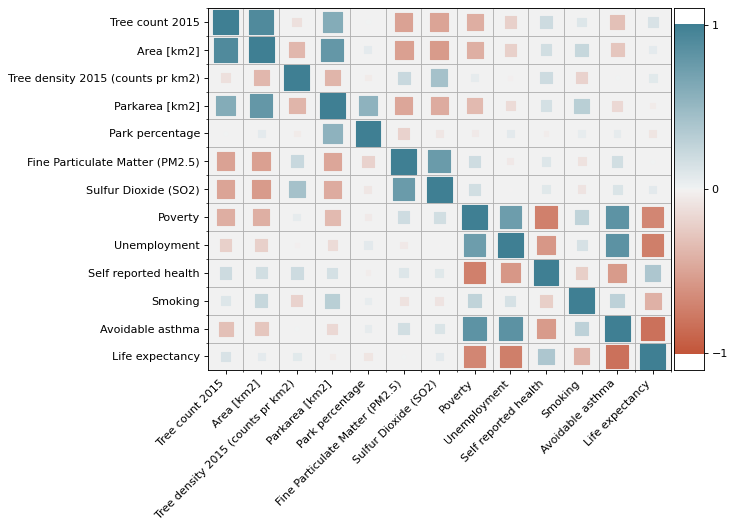

In [65]:
corrplot(df_dens_plot).show()

###  Poisson value
Overview of the poisson values, corresponding to the correlation matrix above.

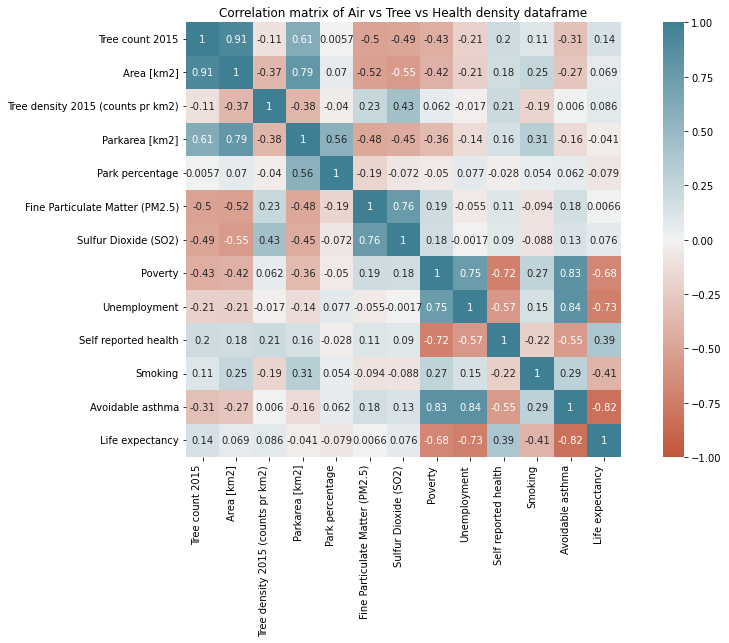

In [66]:
corr = df_dens_plot.corr()
plt.figure(figsize = (15,8))
ax = sns.heatmap(corr,vmin=-1, vmax=1, center=0, cmap=sns.diverging_palette(20, 220, n=256), square=True,annot=True)
ax.set_xticklabels(ax.get_xticklabels(),rotation=90,horizontalalignment='right')
ax.set_title('Correlation matrix of Air vs Tree vs Health density dataframe')
plt.show()

## Pairplots and R2 Value

### The R2 value

The R2 value indicates how much a change in one variable influences the change on another variable. In this analysis this is tested independent for each pair of variables.

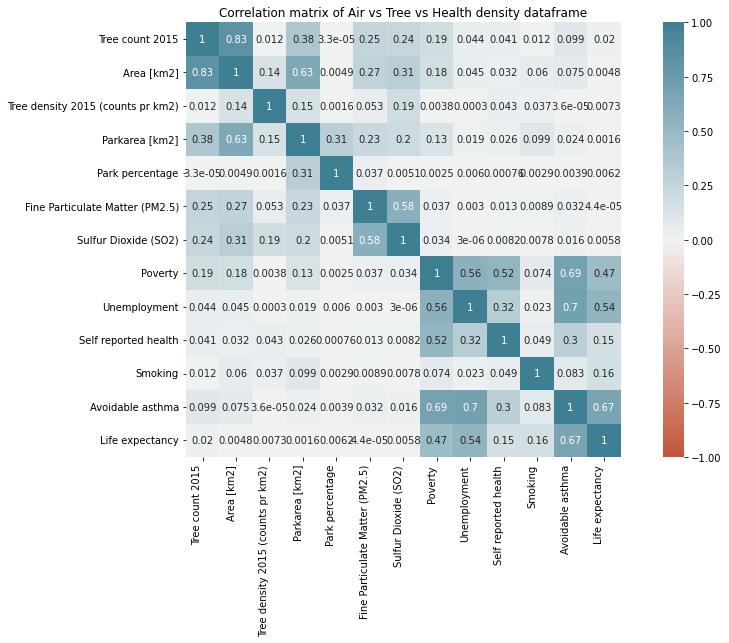

In [67]:
r_square=corr**2
plt.figure(figsize = (15,8))
ax = sns.heatmap(r_square,vmin=-1, vmax=1, center=0, cmap=sns.diverging_palette(20, 220, n=256), square=True,annot=True)
ax.set_xticklabels(ax.get_xticklabels(),rotation=90,horizontalalignment='right')
ax.set_title('Correlation matrix of Air vs Tree vs Health density dataframe')
plt.show()

One can see that the main correlation is found between the social and health variables. That indicates that, when viewed independently, the variables from the different datasets don't have a high influence on the variance of one another.

### Pairplots
#### Tree and Air pairplot

<Figure size 1080x576 with 0 Axes>

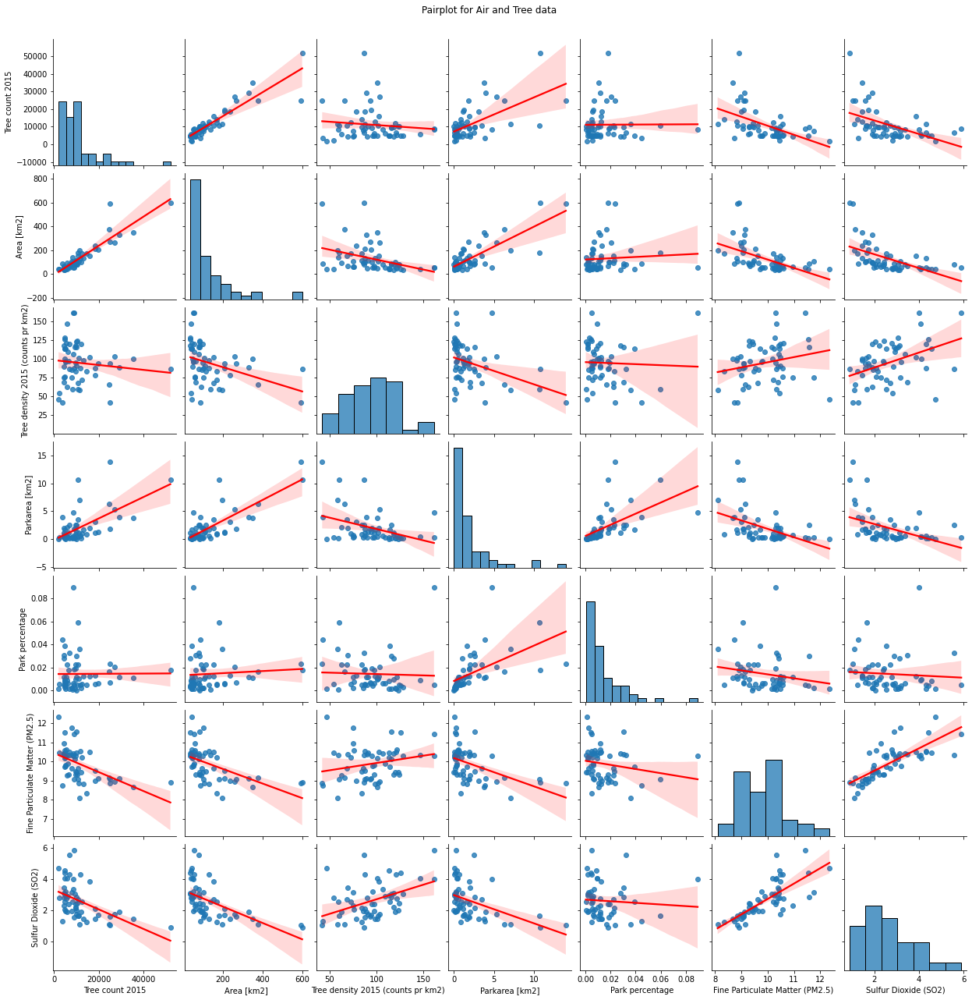

In [68]:
plt.figure(figsize = (15,8))
g = sns.pairplot(df_dens_plot.iloc[:,:7], kind="reg",plot_kws={'line_kws':{'color':'red'}})
g.fig.suptitle("Pairplot for Air and Tree data", y=1.02)
plt.show()

The correlation matrix and scatter plot above show that there is a low correlation between the pollutants and the total number of trees in the various districts on New York. Surprisingly, we see the opposite trend for tree density: As the density increased,fine particles and pollutants increased! 

#### Air and Health pairplot

<Figure size 1080x1080 with 0 Axes>

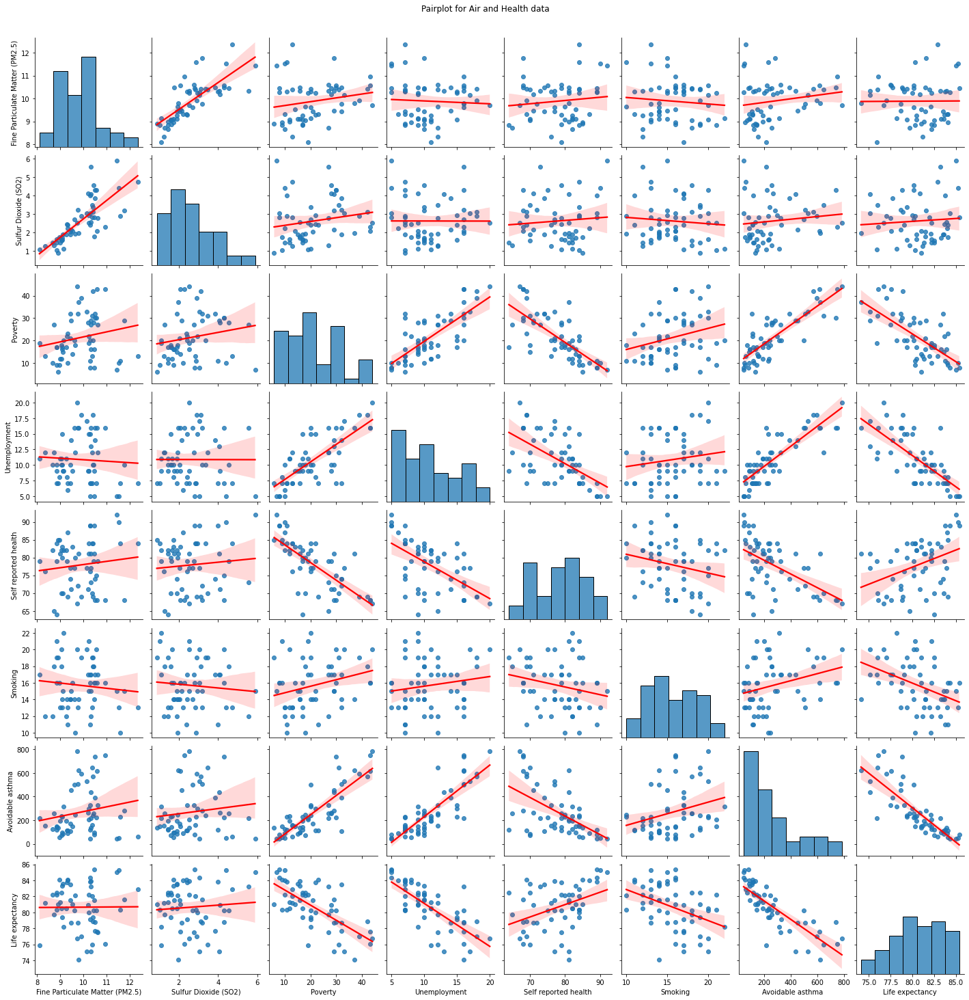

In [69]:
plt.figure(figsize = (15,15))
g = sns.pairplot(df_dens_plot.iloc[:,5:], kind="reg",plot_kws={'line_kws':{'color':'red'}})
g.fig.suptitle("Pairplot for Air and Health data", y=1.02)
plt.show()

From the pairplots one can observe only very few correlations between the airquality and the health dataset. Again, the most obvious correlations are between the social factors and the health factors.

#### Tree and Health pairplot

<Figure size 1080x1080 with 0 Axes>

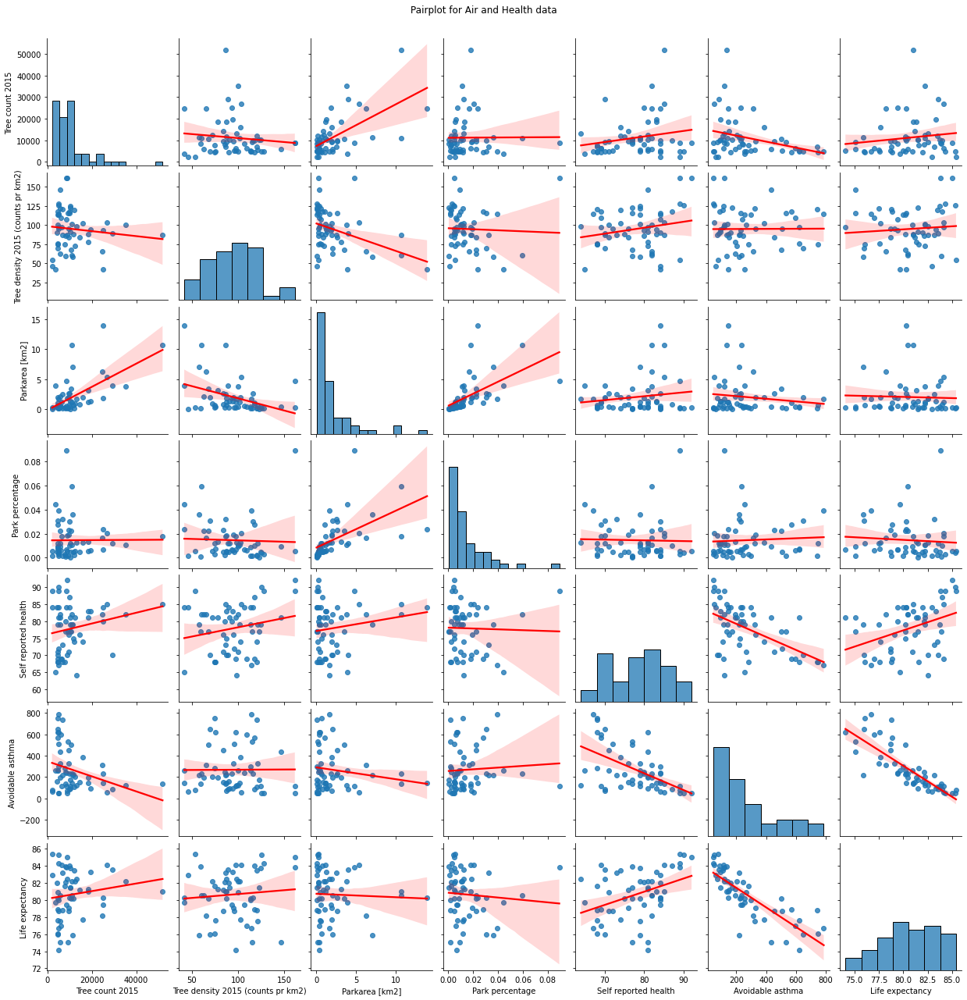

In [70]:
df_pairplot_tree_health=df_dens_plot.drop(['Sulfur Dioxide (SO2)','Fine Particulate Matter (PM2.5)','Unemployment','Poverty','Smoking','Area [km2]'],axis=1)
plt.figure(figsize = (15,15))
g = sns.pairplot(df_pairplot_tree_health, kind="reg",plot_kws={'line_kws':{'color':'red'}})
g.fig.suptitle("Pairplot for Air and Health data", y=1.02)
plt.show()

Also when looking at the tree data against the health data, almost no correlation is visible.


## **3. Data Analysis** ##

In this step, we create a machine learning model, in the attempt to predict the health of the citizens with the available tree and air quality data.


## Modeling

We create two models that uses data related to the various districts of New York to predict the Health related rates among the population. 

The data related to each district used in the training consists of the following:
    
    - Tree counts
    - District areas
    - Trees' density
    - Percentage district area occupied by parks
    - Fine Particulate Matter (PM2.5) (mcg per cubic meter)
    - Sulfur Dioxide (SO2) (ppb)
    - Poverty rate
    - Smoking rate
    - Unemployment rate
    - Self reported health status


The models will try to predict the followig variables: 

    - Number of people with Avoidable Asthma per 100 000 people
    - Life expectancy 

### 1. Loading Data and preprocessing

## Model creation and evaluation

In [71]:
def display_scores(scores):
    print("Scores: {0}\nMean: {1:.3f}\nStd: {2:.3f}".format(scores, np.mean(scores), np.std(scores)))

#### 2.1 Prediction of Avoidable Asthma rate

In [72]:
training_columns = [
                    "count_2015",
                    "area_km2",
                    "counts_per_km2_2015",
                    "Fine Particulate Matter (PM2.5)", 
                    "Sulfur Dioxide (SO2)", 
                    "Poverty",
                    "Smoking",
                    "Self reported health",
                    "Unemployment",
                    'park_percent'] 

target_column = ["Avoidable asthma"]

X = df_final[training_columns]
y = df_final[target_column]

X_train, X_test, y_train, y_test = train_test_split(X, y, 
                                        test_size=0.33, random_state=42)

xgb_model_1 = xgb.XGBRegressor(objective="reg:squarederror", random_state=42)

xgb_model_1.fit(X_train, y_train)

y_pred = xgb_model_1.predict(X_test)

mse=mean_squared_error(y_test, y_pred)

print("MSE: ",np.sqrt(mse))

MSE:  80.43813423162872


In [73]:
df_comparison_1 = y_test.copy()
df_comparison_1['Predictions'] = y_pred
df_comparison_1['ID'] = df_comparison_1.index
df_comparison_1.columns = ['Real', 'Predicted', 'ID']
df_comparison_1 = df_comparison_1.sort_index()

#### 2.2. Prediction of Life Expectancy rate

In [74]:
training_columns = [
                    "count_2015",
                    "area_km2",
                    "counts_per_km2_2015",
                    "Fine Particulate Matter (PM2.5)", 
                    "Sulfur Dioxide (SO2)",
                    "Poverty",
                    "Smoking",
                    "Self reported health",
                    "Unemployment",
                    'park_percent'] 

target_column = ["Life expectancy"]

X = df_final[training_columns]
y = df_final[target_column]

X_train, X_test, y_train, y_test = train_test_split(X, y, 
                                        test_size=0.33, random_state=42)

xgb_model_2 = xgb.XGBRegressor(objective="reg:squarederror", random_state=42)

xgb_model_2.fit(X_train, y_train)

y_pred = xgb_model_2.predict(X_test)

mse=mean_squared_error(y_test, y_pred)

print("MSE: ",np.sqrt(mse))

MSE:  1.6448360491141782


In [75]:
df_comparison_2 = y_test.copy()
df_comparison_2['Predictions'] = y_pred
df_comparison_2['ID'] = df_comparison_2.index
df_comparison_2.columns = ['Real', 'Predicted', 'ID']
df_comparison_2 = df_comparison_2.sort_index()

In [76]:
# Plot the two datasets together
source1 = ColumnDataSource(data=df_comparison_1)
ttps1=[("Real","@Real"),("Predicted","@Predicted")]
fig1 = figure(height=300, width=600, tooltips=ttps1) #p is a standard way to call figures in Bokeh
fig1.line("ID","Real",
              source=source1,
              legend_label="Real",
              color='blue',
              width=0.9)
fig1.line("ID","Predicted",
              source=source1,
              legend_label="Predicted",
              color='red',
              width=0.9)
#fig1.y_range.start = 0
fig1.x_range.range_padding = 0.1
fig1.xgrid.grid_line_color = None
fig1.axis.minor_tick_line_color = None
fig1.outline_line_color = None
fig1.legend.location = "top_right"
fig1.legend.orientation = "vertical"
fig1.legend.title_text_font_style = "bold"
fig1.legend.title_text_font_size = "20px"
fig1.title.text="Results of Avoidable Asthma prediction"
fig1.title.text_font_size = "15px"

l1 = layout([[fig1]], sizing_mode='stretch_both')

source2 = ColumnDataSource(data=df_comparison_2)
ttps2=[("Real","@Real"),("Predicted","@Predicted")]
fig2 = figure(height=300, width=600, tooltips=ttps2) #p is a standard way to call figures in Bokeh
fig2.line("ID","Real",
              source=source2,
              legend_label="Real",
              color='blue',
              width=0.9)
fig2.line("ID","Predicted",
              source=source2,
              legend_label="Predicted",
              color='red',
              width=0.9)
#fig2.y_range.start = 0
fig2.x_range.range_padding = 0.1
fig2.xgrid.grid_line_color = None
fig2.axis.minor_tick_line_color = None
fig2.outline_line_color = None
fig2.legend.location = "top_right"
fig2.legend.orientation = "vertical"
fig2.legend.title_text_font_style = "bold"
fig2.legend.title_text_font_size = "20px"
fig2.title.text="Results of Life Expectancy prediction"
fig2.title.text_font_size = "15px"

l2 = layout([[fig2]], sizing_mode='stretch_both')

tab1 = Panel(child=l1,title="Avoidable Asthma Rate")
tab2 = Panel(child=l2,title="Life Expectancy Rate")
tabs = Tabs(tabs=[tab1, tab2])

curdoc().add_root(tabs)
save(tabs)
bokeh_deepnote_show(tabs)

## Parameter importance and interpretability

We want now to analyze the importance of each variable used to predict the two health factors to understand which are important and which are not. For this reason, we will plot and compare the importance of each variable used to make the prediction, as it was calculated by the model.

In [77]:
# Create a dataframe with the 1st model's parameters
feature_df_1 = pd.DataFrame({'column':xgb_model_1.get_booster().feature_names, 'values':list(xgb_model_1.feature_importances_)})

# Reorder it based on the values
ordered_df_1 = feature_df_1.sort_values(by='values')
my_range_1 = np.arange(1, 2*(len(feature_df_1.index))+1, 2)

# Create a dataframe with the 2nd model's parameters
feature_df_2 = pd.DataFrame({'column':xgb_model_2.get_booster().feature_names, 'values':list(xgb_model_2.feature_importances_)})

# Reorder it based on the values
ordered_df_2 = feature_df_2.sort_values(by='values')
my_range_2 = np.arange(1.5, 2*(len(feature_df_2.index))+1.5, 2)

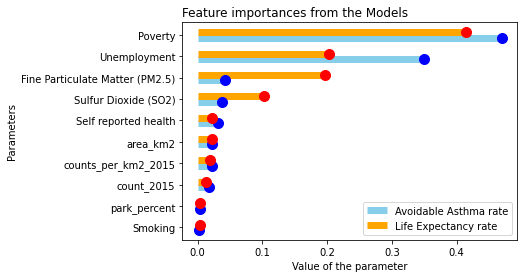

In [78]:
width = 0.5
plt.hlines(y=my_range_1, xmin=0, xmax=ordered_df_1['values'], color='skyblue',linewidth=7)
plt.hlines(y=my_range_2, xmin=0, xmax=ordered_df_2['values'], color='orange',linewidth=7)
plt.plot(ordered_df_1['values'], my_range_1, "o", markersize=10, color='blue')
plt.plot(ordered_df_2['values'], my_range_2, "o", markersize=10, color='red')
plt.yticks([x+0.25 for x in my_range_1], ordered_df_1['column'])
plt.title("Feature importances from the Models", loc='left')
plt.xlabel('Value of the parameter')
plt.ylabel('Parameters')
plt.legend(['Avoidable Asthma rate','Life Expectancy rate'], loc=4)
plt.show()

As we can see from the graph above, the most important features calculated from the prediction model are the social aspects of the population. Unemployment and Poverty appear to be the most important variables in avoiding Asthma and extending the Life Expectancy. The latter, appears to be also determined by the Fine particular matter (PM2.5) level in the districts. Trees density appear to have very low effect in predicting the health of the population.

## **4. Genre** ##

### **Genre Choice** ###
Out of the 7 genres as defined in the the E. Segal and J.Heer paper ([Source](http://vis.stanford.edu/files/2010-Narrative-InfoVis.pdf)), we chose to present our website in a "magazine style." In modern terms, we present the results to the end-user in an online article.

### **Visual Narrative Tools** ###

- **Visual Structruing:** Consistent visual platform. We tried to be make our plots as interactive as possible when needed. Although our project contains some static plots, these are simple in nature and easy to read without the need of interactivity.

- **Highlighting:** We used Close-Ups in our plots to communicate our findings and show variance, especially for our geo plots. We also utilized Feature Distinction by carefully labeling each plot clearly to avoid ambiguity.

- **Transition Guidance**: We utilized a consistent Viewing Angle in our plots, as it results in a better browsing experience for the end-user. For instance, our geo maps have consistent zoom levels, and when data is compared in time, we used the same colorbar scale and limits for a superior user experience.

### **Narrative Structure Tools** ###

- **Ordering:** We believe in empowering our users. Thus, we opted to use a User-Directed approach on our website ordering. The user can select which sections are shown based on the user's interest in the subject matter.

- **Interactivity:** This is a major theme of our work. We heavily emphasized user interactivity with our plots, including Hover Highlighting, Filtering, and Navigation Buttons (Drop-Down Menus). Since our data is divided by 59 district, user interactivity was an important factors so that a user can inspect each district's results.

- **Messaging:** Since our results are presented in an online article, we used Introductory Text, Summary (Conclusions), and an Accompanying Article (of course!). These are the pillars of an online article regardless of the results.

## **5. Visualizations** ##

Due to the already large size of this file, and to avoid unnecessary redundancy, we direct the reader to our online project article, which contains all the visualizations, their explanations, and purposes.

## **6. Discussion** ##

The purpose of this analysis was to understand what is the relation between health, trees and air quality among the districts of New York City. We studied different datasets, and built a Machine Learning Model that predicted Avoidable Asthma Rate and Life Expectancy Rate in 2015 using social aspects, air quality levels and tree density in the various districts.  The results are that the most important variables when considering health are social factors related to the economic conditions of the people studied, in our case employment and poverty.  Air pollution also affects the Life expectancy, although we only found low influence when considering the Sulfur Dioxide levels, probably because of the low variance between district in the chosen year. On te other hand, the number of trees in a districts appears to have low importance. The reason behind this is that probably the effect of trees on health can only be seen in a greater scale, and not analyzing each specific district.

### **What Went Well?** ###

- **Clean-ish Datasets:** No dataset is ever perfect. The datasets we used were relatively clean, and did not contain many missing values.

- **Mostly Numerical Features:** This made it easier to visualize and correlate features quickly for our analysis.

- **The Importance of Socioeconomic Factors:** The results of this project reiterates the importance of socioeconomic factors for the well being of NYC residents. They are more important than even planting more trees based on the data modeling we did. In fact, the tree density was found to be positively correlated with the socioeconomic factors. Government should thus prioritize the improvement of the socioeconomic factors, assuming they have limited resources.


### **Areas of Improvements** ###

- **Dead Tree Analysis:** Due to the scope of the project, we did not investigate if the dead tree counts and densities per district were correlated with the health outcomes. This was justified by the fact the count of the dead trees is very small, which will result in high variance in our statistical models.

- **Districts Limitations:** We analyzed the data geographically by the 59 districts of NYC, as this was a common feature in all datasets. This results in a somewhat reduced resolution. A more comprehensive analysis would cluster the data geographically by other factors, such as pollution levels in poor areas. Such areas would cross the districts' boundaries.

- **Data Modeling Limitations:** Our model might have been too simplistic and ungeneralizable. We did not implement cross-validation. Also, such a complex (non-linear) problem could have benefited from using neural networks.

- **Website Design with Python:** Since none of our team members has web development experience, and since preserving plots interactivity and user choice was an important feature of our project, we used python code to design the website with a library called streamlit. This ended up working well, but with some limitations, such as slow loading times, and limited resources. 

### **Contributions** ###

- **Nina Susann Öhlckers (s213535):** Health data wrangling and analysis. Inclusion of park data. Website design and setup. Introduction and conclusions sections write ups. EDA of the merged dataset. Correlation analysis of the merged dataset.

- **Saud Shaheen (s213077):** Tree data wrangling and analysis. Final notebook setup and merging. Data modeling strategy. Collaborative environment setup (Deepnote).

- **Matteo Sabadin (s212980):** Air quality data wrangling and analysis. Data modeling implementation. Data modeling optimization. Conclusion section draft.

<a style='text-decoration:none;line-height:16px;display:flex;color:#5B5B62;padding:10px;justify-content:end;' href='https://deepnote.com?utm_source=created-in-deepnote-cell&projectId=6a6006c7-f931-4143-8a79-5368592f6d54' target="_blank">
 </img>
Created in <span style='font-weight:600;margin-left:4px;'>Deepnote</span></a>